# Time Series Forecasting

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning, module="statsmodels.tsa.base.tsa_model")
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [3]:
#import neccessary libraries
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
from pmdarima import auto_arima
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

**Along with ARIMA with seasonal Adjusted data we employed 3 other timeseries models and compared the performance of the four models.**

**Exponential Smoothing (ETS):**
- Captures error, trend, and seasonality components.
- Uses weighted averages of past data, with more weight on recent observations.
- Additive trend and seasonality were used in our model.
- Suitable for series with fixed seasonal patterns and consistent trends.
- No stationarity requirement.

**Seasonal Naive:**
- Forecasts are based on the most recent seasonal values.
- Assumes that patterns repeat exactly across seasons.
- Simple and effective for data with strong, consistent seasonality.
- Used as a baseline model.

**Auto ARIMA:**
- Automatically selects the best **p, d, q, P, D, Q, m** parameters.
- Combines autoregressive, differencing, and moving average terms.
- Optimizes based on criteria like **AIC**.
- Requires stationarity and handles it internally through differencing.


In [4]:
#Load the Dataset
file_path = 'metroregion_filtered_data.csv'
data = pd.read_csv(file_path) 
data['Date'] = pd.to_datetime(data[['Year', 'Month']].assign(DAY=1))

#### Code for four Time series models plot comparison and evaluation metrics for each city

In [5]:
def calculate_metrics_mae_rmse_r2(data, target_metroregion_name, forecast_steps=12):
    """
    Calculate MAE and RMSE for each EFPG_name in the given Metroregion_name.
    """
    metrics_results = []
    
    # Filter data for the given Metroregion_name
    metro_data = data[data['Metroregion_name'] == target_metroregion_name]

    # Loop through all EFPG_name for the target Metroregion
    for efpg_name in metro_data['EFPG_name'].unique():
        efpg_data = metro_data[metro_data['EFPG_name'] == efpg_name]

        try:
            # Prepare the time series
            time_series = efpg_data.groupby('Date')['Purchase_grams_wtd'].sum()
            time_series = time_series.asfreq('MS').fillna(0)

            # Seasonal decomposition
            decomposition = seasonal_decompose(time_series, model='additive', period=12)
            seasonally_adjusted = time_series - decomposition.seasonal

            # ARIMA Model
            model = ARIMA(seasonally_adjusted, order=(1, 1, 1))
            fitted_model = model.fit()

            # Forecasting
            forecast_adjusted = fitted_model.forecast(steps=forecast_steps)
            seasonal_component = decomposition.seasonal[-12:]
            forecast_final = forecast_adjusted + np.tile(seasonal_component, int(np.ceil(forecast_steps / 12)))[:forecast_steps]

            # Evaluate
            actual = time_series[-forecast_steps:]
            if len(actual) > 0:
                mae = mean_absolute_error(actual, forecast_final[:len(actual)])
                rmse = np.sqrt(mean_squared_error(actual, forecast_final[:len(actual)]))

            else:
                mae, rmse = None, None

            metrics_results.append({
                'EFPG_name': efpg_name,
                'Metroregion_name': target_metroregion_name,
                'MAE_ARIMA_Seasonal_Decomposition': mae,
                'RMSE_ARIMA_Seasonal_Decomposition': rmse,
                'ARIMA_Seasonal_Decomposition_Forecast': forecast_final
            })

        except Exception as e:
            print(f"Error processing {efpg_name} in {target_metroregion_name}: {e}")

    return pd.DataFrame(metrics_results)


def analyze_metroregion(data, target_metroregion):
    """
    Analyze time series models (ETS, Seasonal Naive, AutoARIMA) for all EFPG_names in a given Metroregion.
    """
    # Filter data for the given Metroregion
    metro_data = data[data['Metroregion_name'] == target_metroregion]

    # Get unique EFPG_names
    efpg_names = metro_data['EFPG_name'].unique()

    # Store results
    results = []

    print(f"\nProcessing Metroregion: {target_metroregion}\n")

    # Loop through each EFPG_name
    for efpg in efpg_names:
        efpg_data = metro_data[metro_data['EFPG_name'] == efpg]

        # Prepare the time series
        efpg_data['Date'] = pd.to_datetime(efpg_data[['Year', 'Month']].assign(DAY=1))
        efpg_data = efpg_data.sort_values(by='Date')[['Date', 'Purchase_grams_wtd']]
        efpg_data.set_index('Date', inplace=True)

        # Train-test split
        train = efpg_data.iloc[:-12]
        test = efpg_data.iloc[-12:]

        # Models
        try:
            # ETS
            ets_model = ExponentialSmoothing(
                train['Purchase_grams_wtd'], seasonal='add', seasonal_periods=12, trend='add'
            ).fit()
            ets_forecast = ets_model.forecast(steps=len(test))
            mae_ets = mean_absolute_error(test, ets_forecast)
            rmse_ets = mean_squared_error(test, ets_forecast, squared=False)
        

            # Seasonal Naive
            seasonal_naive_forecast = train.iloc[-12:].values.flatten()
            seasonal_naive_forecast = np.tile(seasonal_naive_forecast, int(np.ceil(len(test) / 12)))[:len(test)]
            mae_naive = mean_absolute_error(test, seasonal_naive_forecast)
            rmse_naive = mean_squared_error(test, seasonal_naive_forecast, squared=False)


            # AutoARIMA
            auto_arima_model = auto_arima(
                train['Purchase_grams_wtd'], seasonal=True, m=12, trace=False, error_action='ignore'
            )
            arima_forecast = auto_arima_model.predict(n_periods=len(test))
            mae_arima = mean_absolute_error(test, arima_forecast)
            rmse_arima = mean_squared_error(test, arima_forecast, squared=False)

            # Extract AutoARIMA order
            order_autoarima = {
                "Order": auto_arima_model.order,       # (p, d, q)
                "Seasonal_Order": auto_arima_model.seasonal_order  # (P, D, Q, m)
            }

            # Visualization of comparison
            plt.figure(figsize=(14, 6))

            # Combine training and test data for a continuous plot
            combined_data = pd.concat([train, test], axis=0)
            plt.plot(combined_data.index, combined_data['Purchase_grams_wtd'], label='Actual Data', color='blue')
            plt.plot(test.index, ets_forecast, label='ETS Forecast', linestyle='--', color='red')
            plt.plot(test.index, seasonal_naive_forecast, label='Seasonal Naive Forecast', linestyle='--', color='orange')
            plt.plot(test.index, arima_forecast, label='AutoARIMA Forecast', linestyle='--', color='purple')

            # Seasonal Decomposition Forecast
            seasonal_metrics = calculate_metrics_mae_rmse_r2(data, target_metroregion, forecast_steps=12)
            seasonal_forecast = seasonal_metrics[seasonal_metrics['EFPG_name'] == efpg]['ARIMA_Seasonal_Decomposition_Forecast'].iloc[0]
            plt.plot(test.index, seasonal_forecast, label='ARIMA with Seasonal Decomposition Forecast', linestyle='--', color='green')

            # Add plot details
            plt.title(f"{efpg} in {target_metroregion}")
            plt.xlabel("Date")
            plt.ylabel("Purchase_grams_wtd")
            plt.legend()
            plt.grid()
            plt.show()

            # Store results
            results.append({
                'EFPG_name': efpg,
                'Metroregion_name': target_metroregion,
                'MAE_ETS': mae_ets,
                'RMSE_ETS': rmse_ets,
                'MAE_Seasonal_Naive': mae_naive,
                'RMSE_Seasonal_Naive': rmse_naive,
                'MAE_AutoARIMA': mae_arima,
                'RMSE_AutoARIMA': rmse_arima,
                'Order_AutoARIMA': order_autoarima
            })

        except Exception as e:
            print(f"Error processing {efpg} in {target_metroregion}: {e}")

    # Create a summary DataFrame for results
    results_df = pd.DataFrame(results)

    # Get Seasonal Decomposition Metrics
    seasonal_metrics_df = calculate_metrics_mae_rmse_r2(data, target_metroregion, forecast_steps=12)

    # Merge both results
    merged_results = results_df.merge(
        seasonal_metrics_df,
        on=['EFPG_name', 'Metroregion_name'],
        how='left'
    )

    return merged_results


## Code for choosing the best model among the four.

In [6]:
def best_model(results_df):
    results_df['Best_Model'] = results_df[['RMSE_ETS', 'RMSE_Seasonal_Naive', 'RMSE_AutoARIMA','RMSE_ARIMA_Seasonal_Decomposition']].idxmin(axis=1)

    model_mapping = {
        'RMSE_ETS': 'ETS',
        'RMSE_Seasonal_Naive': 'Seasonal Naive',
        'RMSE_AutoARIMA': 'AutoARIMA',
        'RMSE_ARIMA_Seasonal_Decomposition': 'ARIMA'
    }
    results_df['Best_Model'] = results_df['Best_Model'].map(model_mapping)

    return results_df

## 'Atlanta-Sandy Springs-Roswell  GA'


Processing Metroregion: Atlanta-Sandy Springs-Roswell  GA



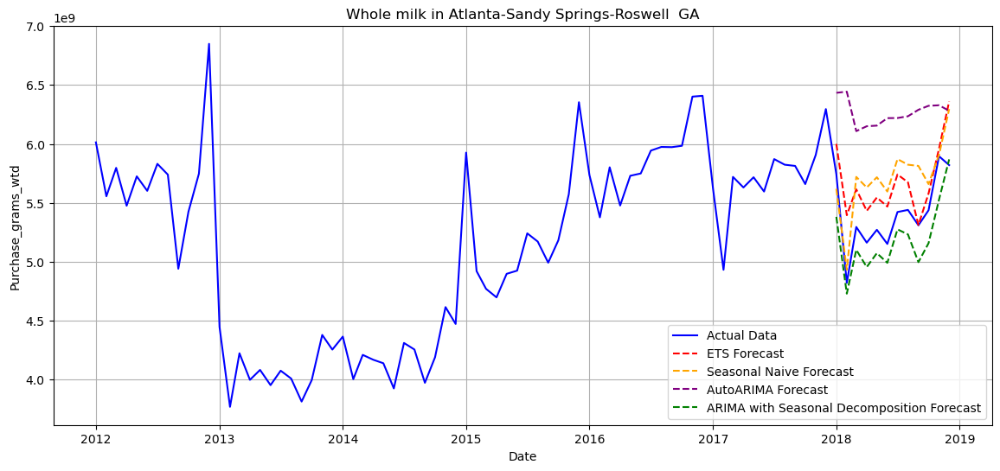

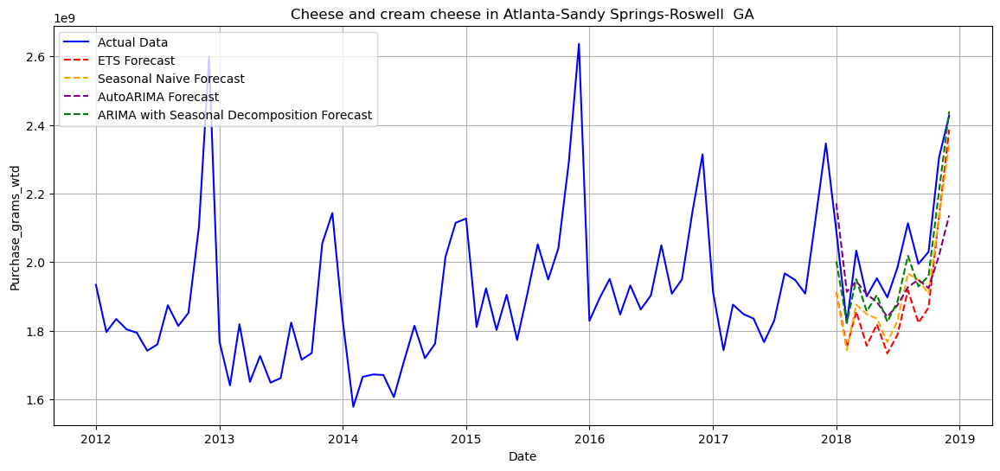

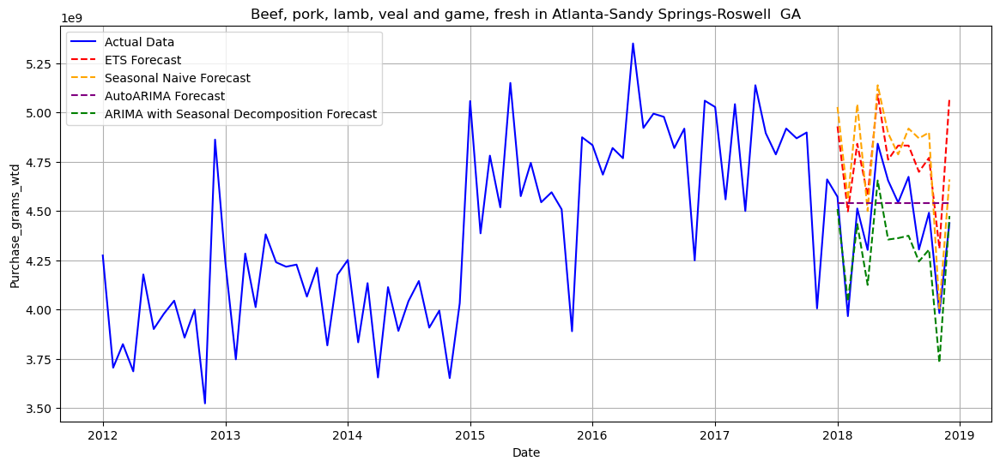

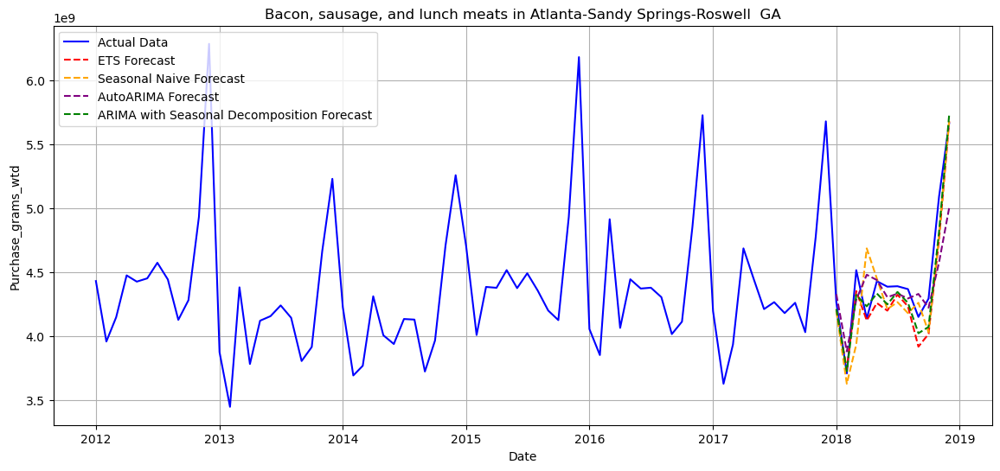

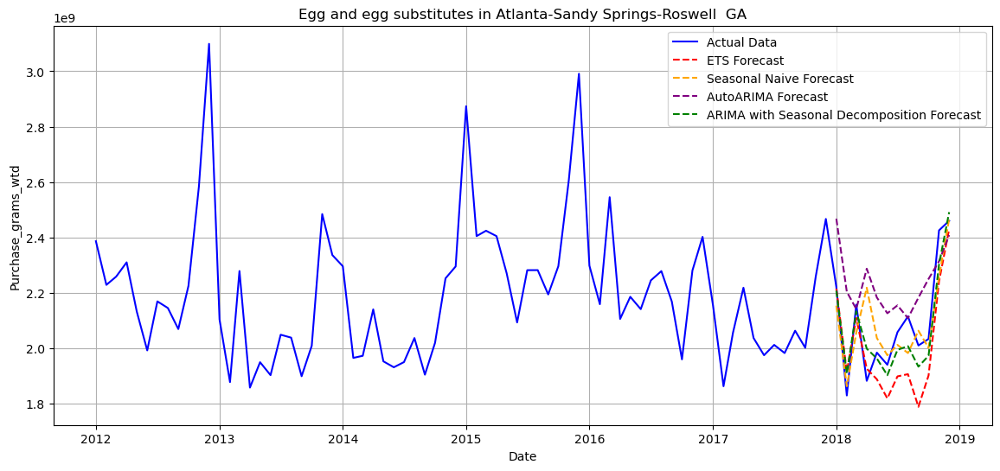

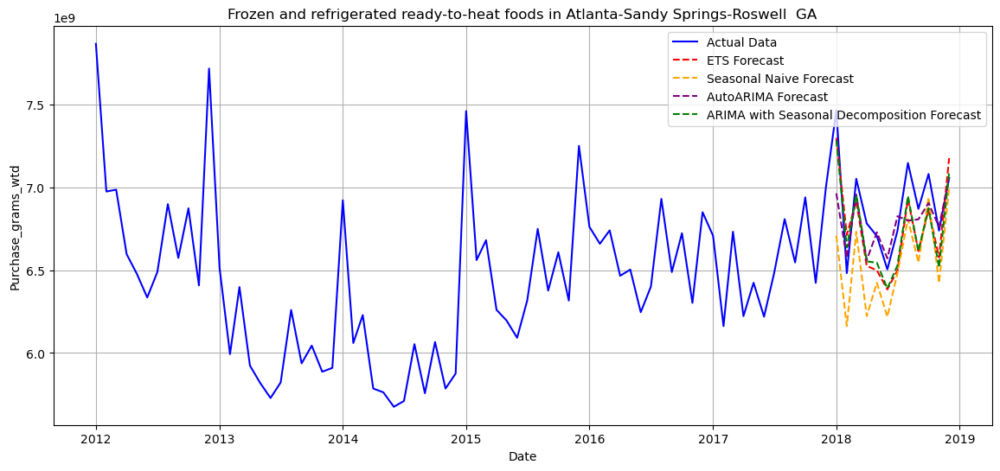

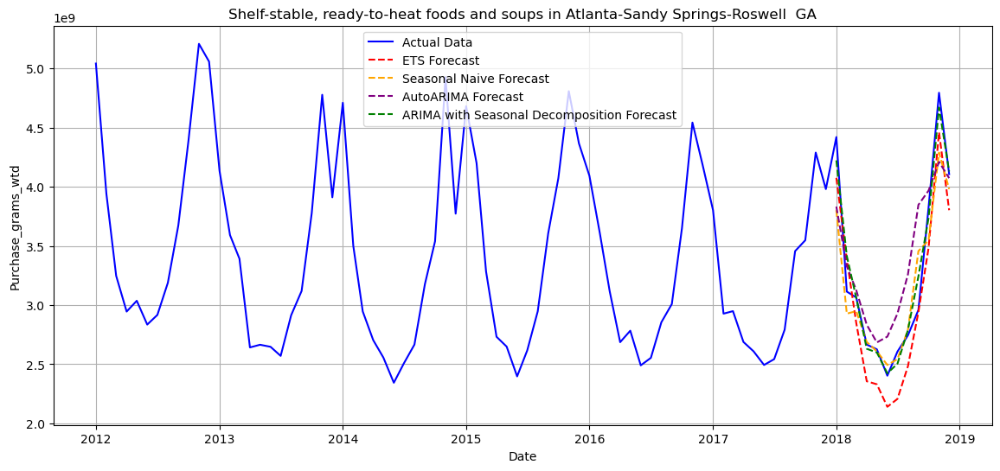

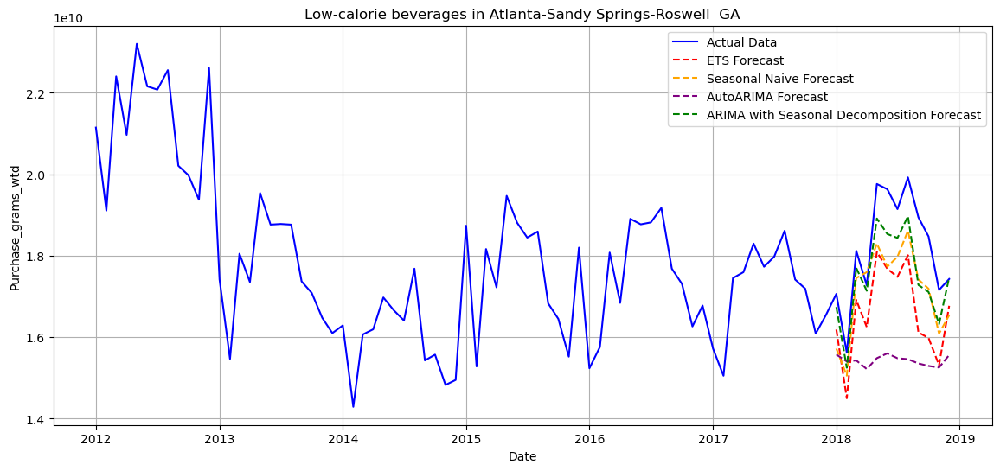

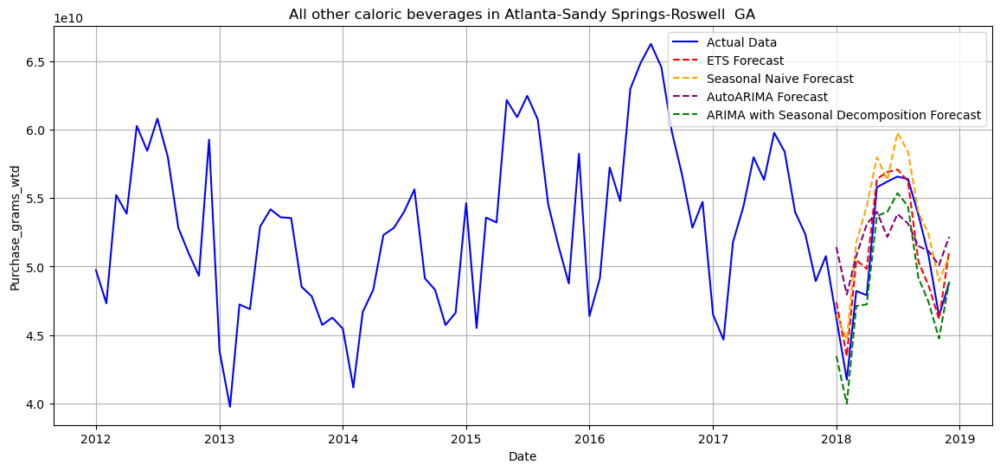

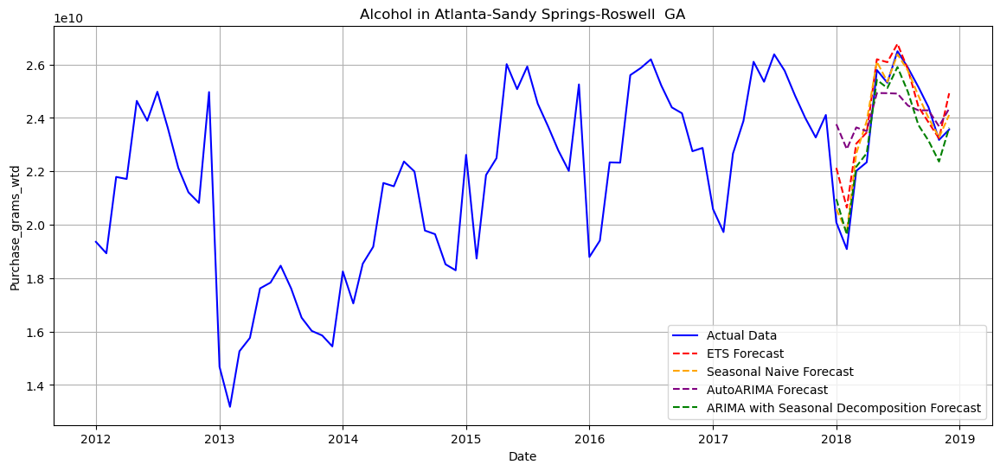

In [7]:
target_metroregion = 'Atlanta-Sandy Springs-Roswell  GA'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])


#### Table showing RMSE, MAE for different food categories in'Atlanta-Sandy Springs-Roswell  GA'

In [8]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Atlanta-Sandy Springs-Roswell GA,2.760632e+08,3.186290e+08,3.385456e+08,3.764668e+08,8.677930e+08,9.161719e+08,"{'Order': (1, 1, 1), 'Seasonal_Order': (2, 0, ...",2.145954e+08,2.349798e+08,ARIMA
1,Cheese and cream cheese,Atlanta-Sandy Springs-Roswell GA,1.506955e+08,1.575906e+08,1.202482e+08,1.279881e+08,1.182455e+08,1.465275e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",6.494441e+07,7.211387e+07,ARIMA
2,"Beef, pork, lamb, veal and game, fresh",Atlanta-Sandy Springs-Roswell GA,3.274268e+08,3.557568e+08,3.348043e+08,3.738327e+08,1.971414e+08,2.718116e+08,"{'Order': (0, 1, 1), 'Seasonal_Order': (0, 0, ...",1.578429e+08,1.819059e+08,ARIMA
3,"Bacon, sausage, and lunch meats",Atlanta-Sandy Springs-Roswell GA,1.405542e+08,1.735502e+08,2.070774e+08,2.754348e+08,2.049482e+08,2.828601e+08,"{'Order': (2, 0, 1), 'Seasonal_Order': (1, 0, ...",1.195430e+08,1.404326e+08,ARIMA
4,Egg and egg substitutes,Atlanta-Sandy Springs-Roswell GA,1.114012e+08,1.309838e+08,8.857166e+07,1.239686e+08,1.734597e+08,2.121995e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",6.279269e+07,7.272361e+07,ARIMA
5,Frozen and refrigerated ready-to-heat foods,Atlanta-Sandy Springs-Roswell GA,1.942577e+08,2.002514e+08,3.300234e+08,3.722632e+08,1.417071e+08,2.017246e+08,"{'Order': (3, 0, 1), 'Seasonal_Order': (0, 0, ...",1.725431e+08,1.827292e+08,ARIMA
6,"Shelf-stable, ready-to-heat foods and soups",Atlanta-Sandy Springs-Roswell GA,2.804117e+08,2.949071e+08,2.138995e+08,2.944788e+08,3.253848e+08,4.138746e+08,"{'Order': (2, 0, 3), 'Seasonal_Order': (0, 0, ...",1.043932e+08,1.441321e+08,ARIMA
7,Low-calorie beverages,Atlanta-Sandy Springs-Roswell GA,1.603896e+09,1.722157e+09,1.126428e+09,1.205606e+09,2.785095e+09,3.050707e+09,"{'Order': (2, 1, 0), 'Seasonal_Order': (2, 0, ...",7.294885e+08,8.702817e+08,ARIMA
8,All other caloric beverages,Atlanta-Sandy Springs-Roswell GA,1.435685e+09,1.740322e+09,2.249436e+09,1.336148e+09,3.388845e+09,3.729654e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",1.958266e+09,2.281526e+09,Seasonal Naive
9,Alcohol,Atlanta-Sandy Springs-Roswell GA,8.305339e+08,1.017117e+09,4.395969e+08,5.891010e+08,1.395806e+09,1.794030e+09,"{'Order': (1, 1, 0), 'Seasonal_Order': (1, 0, ...",6.276346e+08,7.529984e+08,Seasonal Naive


## Boston-Cambridge-Newton  MA-NH


Processing Metroregion: Boston-Cambridge-Newton  MA-NH



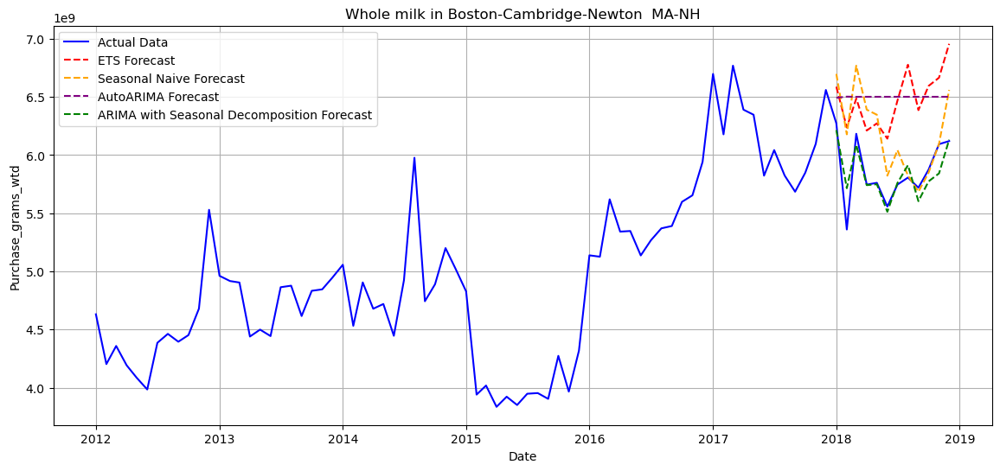

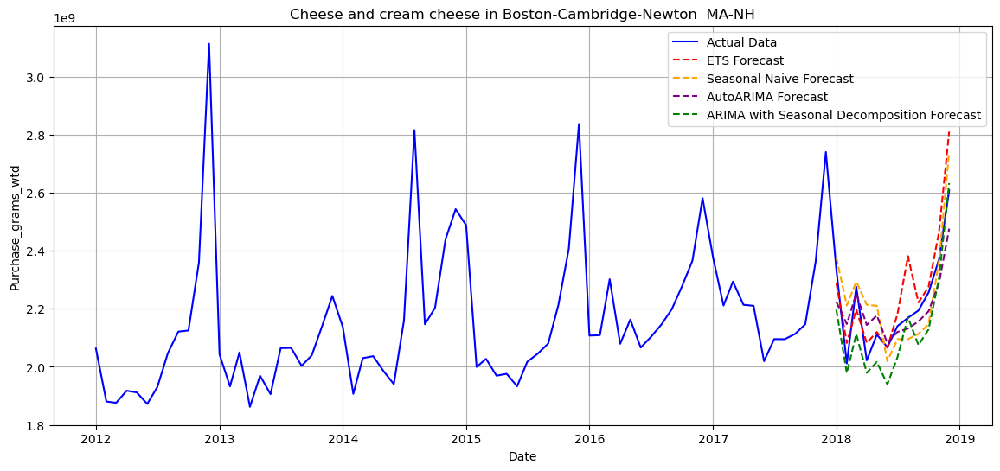

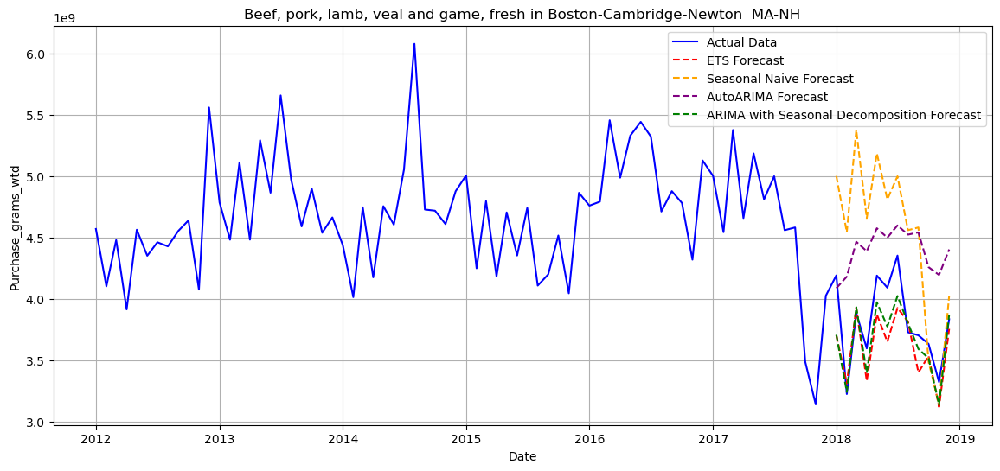

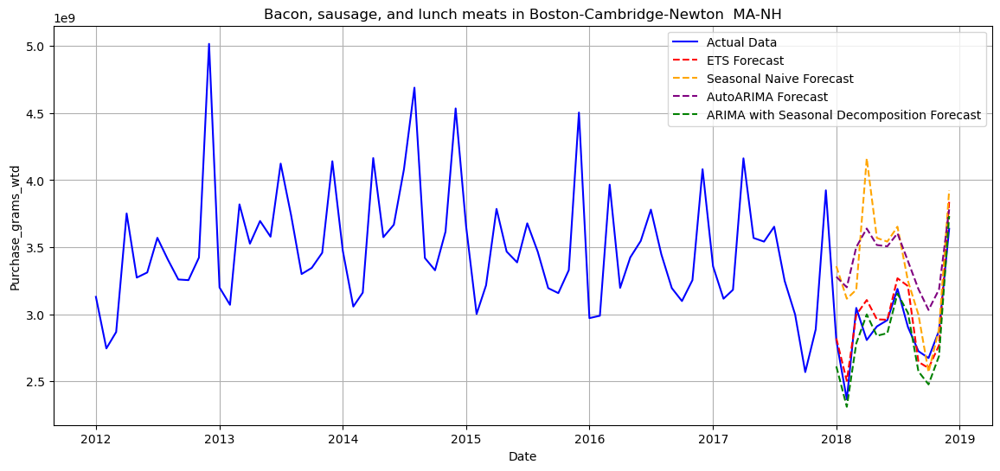

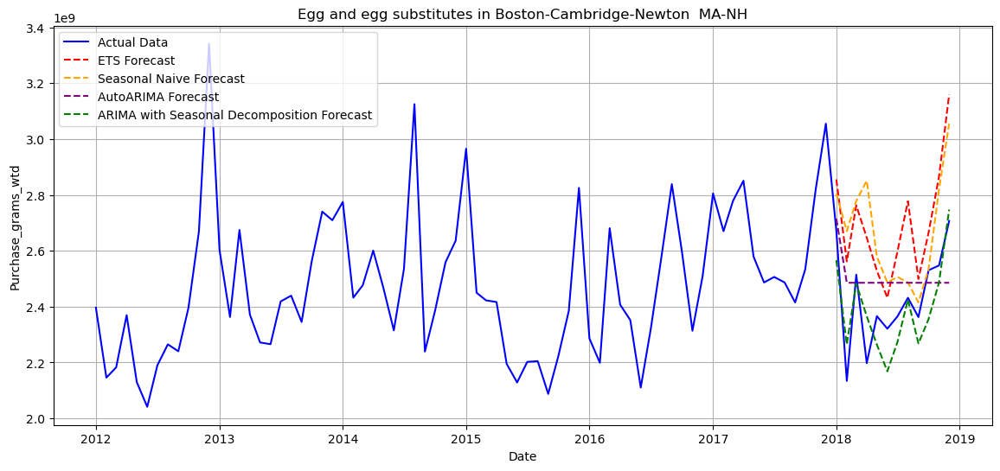

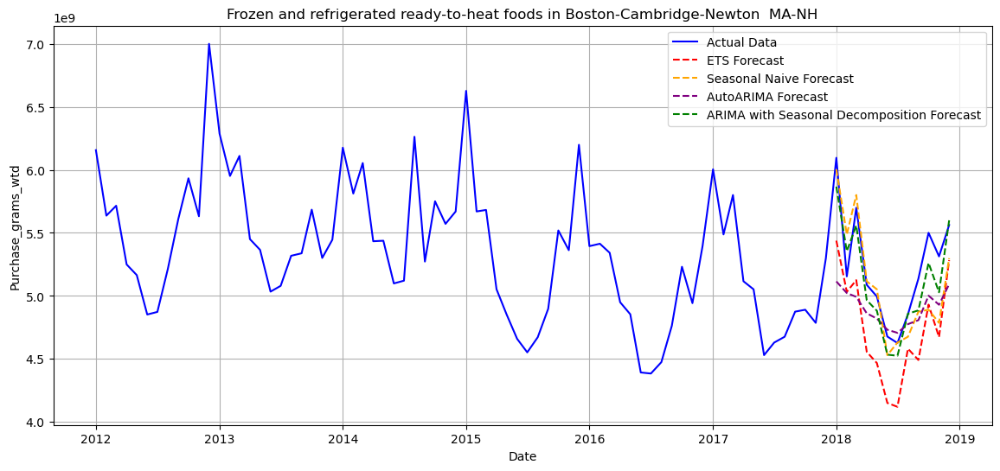

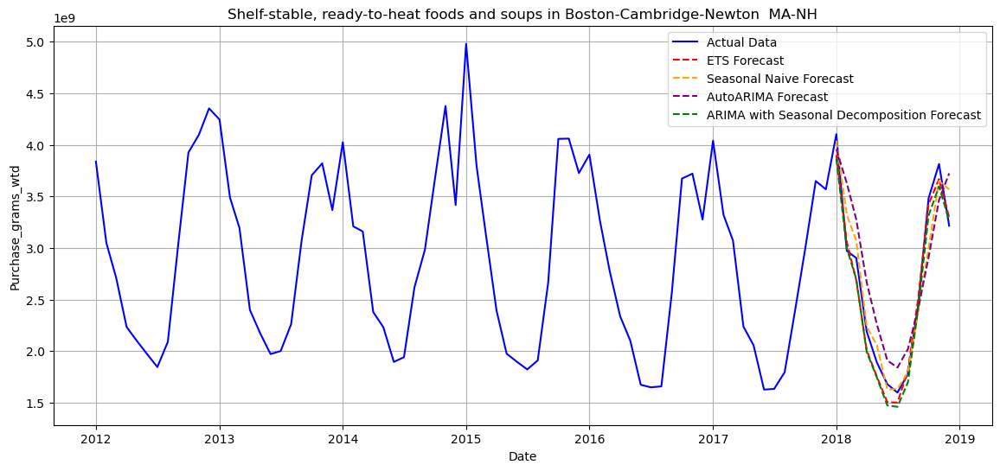

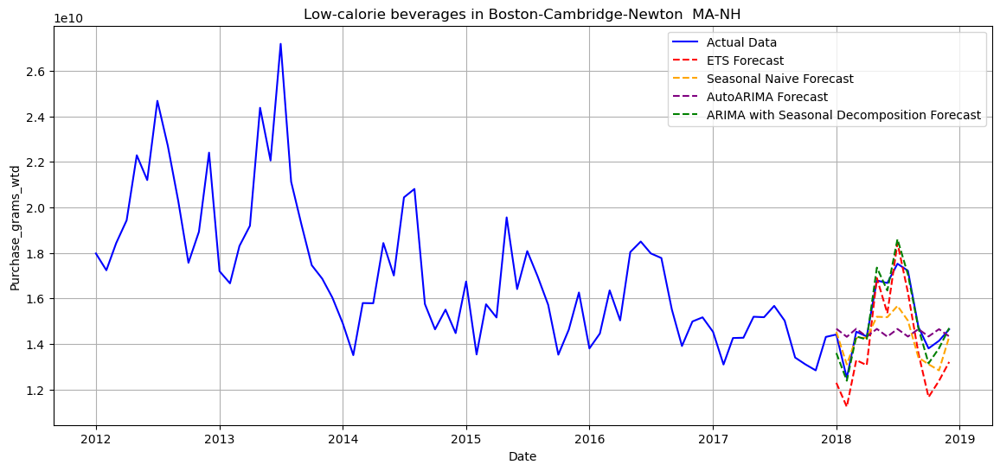

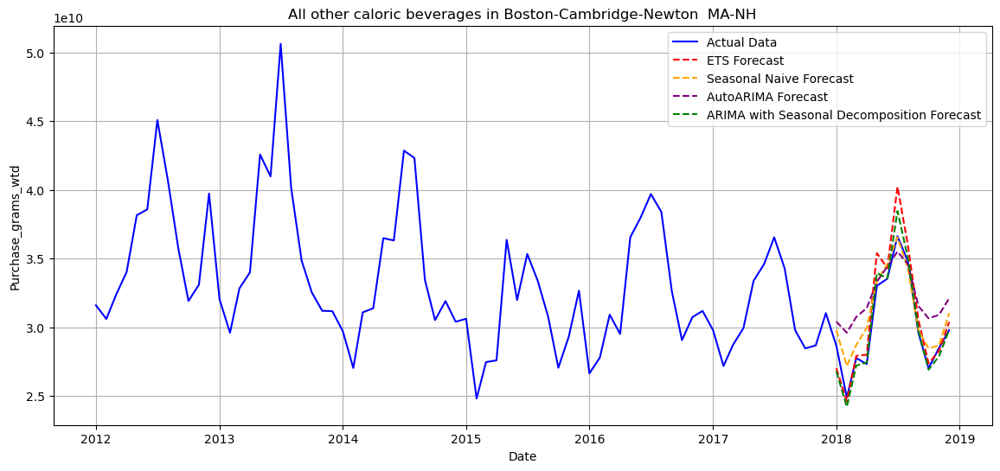

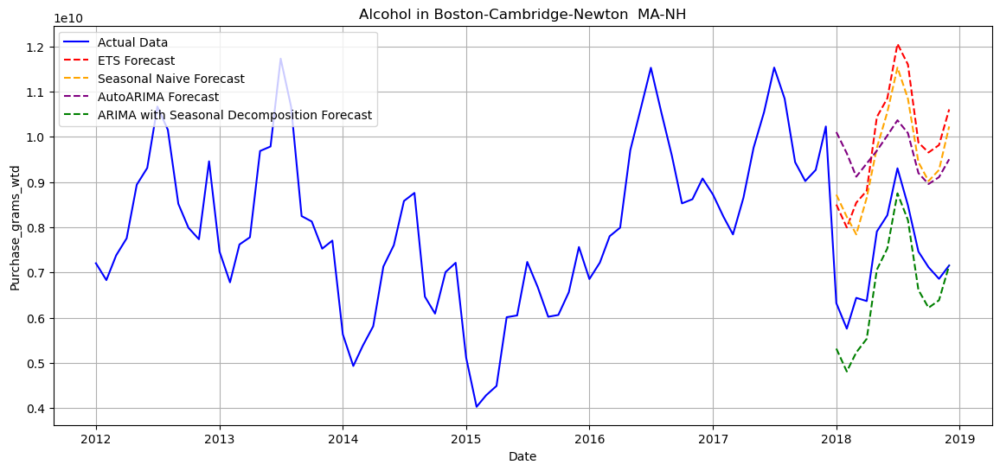

In [9]:
target_metroregion = 'Boston-Cambridge-Newton  MA-NH'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in Boston-Cambridge-Newton  MA-NH

In [10]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Boston-Cambridge-Newton MA-NH,6.286967e+08,6.604155e+08,3.451226e+08,4.383242e+08,6.472360e+08,6.971644e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (0, 0, ...",9.751215e+07,1.411090e+08,ARIMA
1,Cheese and cream cheese,Boston-Cambridge-Newton MA-NH,7.205426e+07,9.793029e+07,8.701589e+07,1.056968e+08,7.061690e+07,8.295788e+07,"{'Order': (1, 0, 1), 'Seasonal_Order': (2, 0, ...",8.719676e+07,1.003665e+08,AutoARIMA
2,"Beef, pork, lamb, veal and game, fresh",Boston-Cambridge-Newton MA-NH,2.359198e+08,2.811466e+08,7.729594e+08,8.771028e+08,5.978818e+08,6.506208e+08,"{'Order': (2, 0, 0), 'Seasonal_Order': (0, 0, ...",1.781252e+08,2.237269e+08,ARIMA
3,"Bacon, sausage, and lunch meats",Boston-Cambridge-Newton MA-NH,1.174687e+08,1.521379e+08,4.603414e+08,5.778214e+08,4.945936e+08,5.297186e+08,"{'Order': (2, 0, 2), 'Seasonal_Order': (2, 0, ...",1.372046e+08,1.529320e+08,ETS
4,Egg and egg substitutes,Boston-Cambridge-Newton MA-NH,2.670721e+08,2.939537e+08,2.366402e+08,3.022538e+08,1.351309e+08,1.677904e+08,"{'Order': (0, 0, 1), 'Seasonal_Order': (0, 0, ...",9.651597e+07,1.096062e+08,ARIMA
5,Frozen and refrigerated ready-to-heat foods,Boston-Cambridge-Newton MA-NH,4.877493e+08,5.143598e+08,2.168298e+08,2.850707e+08,3.429662e+08,4.379457e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (1, 0, ...",1.553957e+08,1.762714e+08,ARIMA
6,"Shelf-stable, ready-to-heat foods and soups",Boston-Cambridge-Newton MA-NH,1.229214e+08,1.362219e+08,1.644292e+08,2.200730e+08,3.507289e+08,3.913125e+08,"{'Order': (2, 0, 2), 'Seasonal_Order': (1, 0, ...",1.419432e+08,1.598483e+08,ETS
7,Low-calorie beverages,Boston-Cambridge-Newton MA-NH,1.309033e+09,1.411091e+09,9.887215e+08,1.210890e+09,1.157397e+09,1.598920e+09,"{'Order': (1, 1, 1), 'Seasonal_Order': (0, 0, ...",3.754111e+08,4.920252e+08,ARIMA
8,All other caloric beverages,Boston-Cambridge-Newton MA-NH,1.064780e+09,1.451174e+09,1.004429e+09,1.275231e+09,2.196131e+09,2.602552e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (2, 0, ...",5.987819e+08,8.632378e+08,ARIMA
9,Alcohol,Boston-Cambridge-Newton MA-NH,2.609444e+09,2.637458e+09,2.220882e+09,1.883923e+09,2.314391e+09,2.462729e+09,"{'Order': (2, 0, 0), 'Seasonal_Order': (0, 0, ...",7.229033e+08,7.895839e+08,ARIMA


## 'Chicago-Naperville-Elgin  IL-IN-WI'


Processing Metroregion: Chicago-Naperville-Elgin  IL-IN-WI



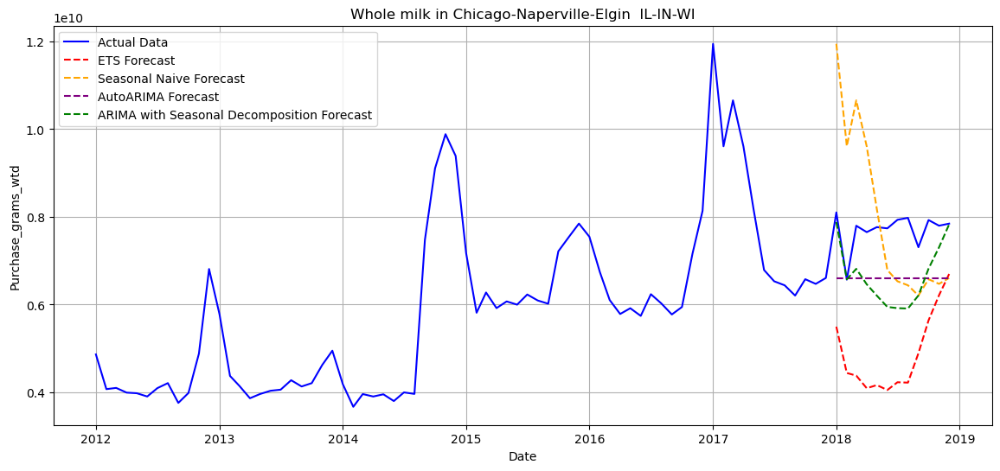

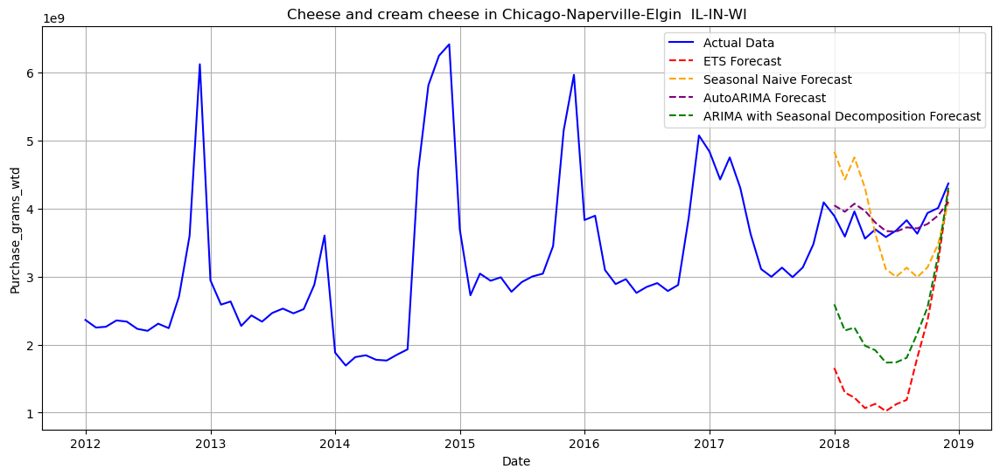

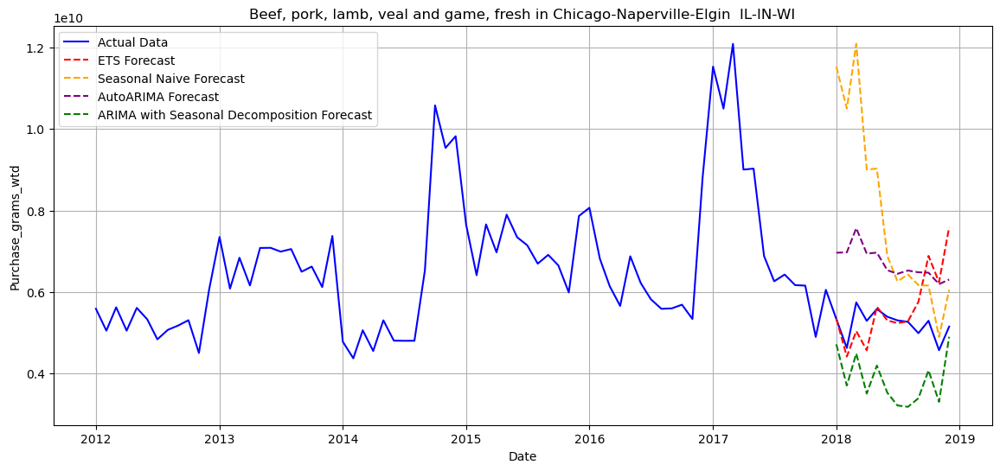

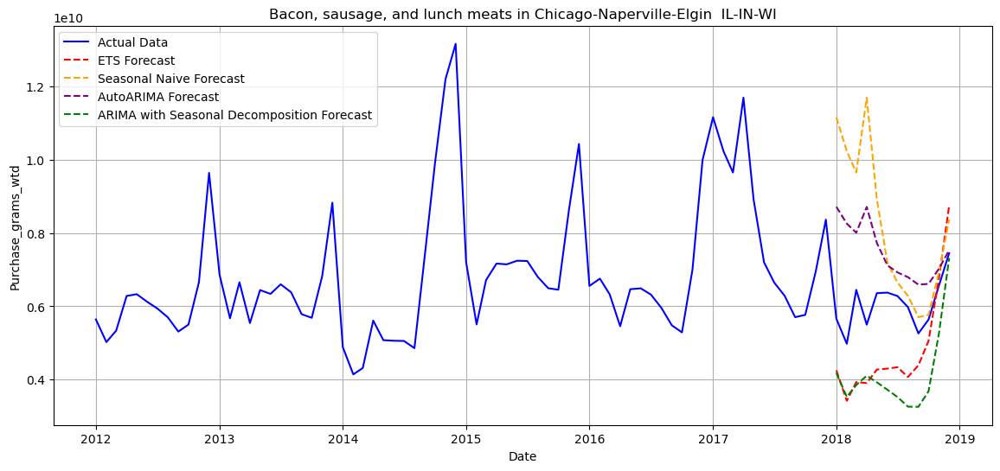

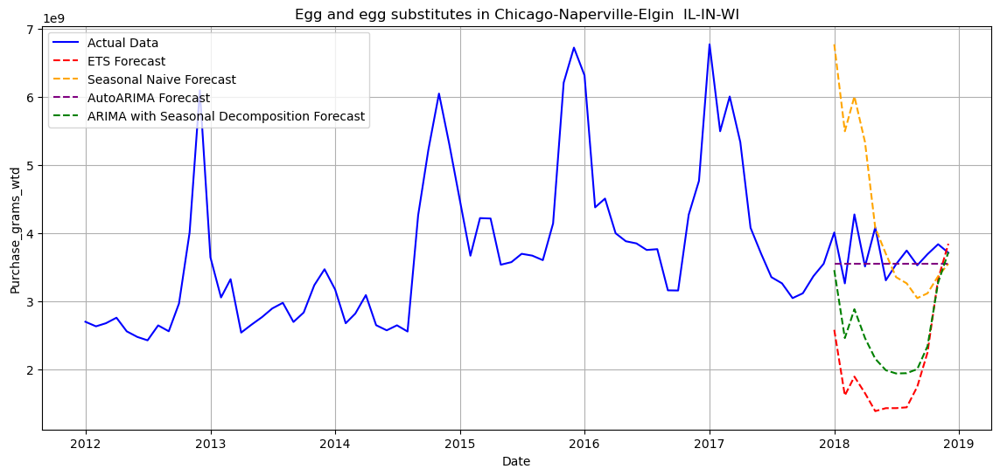

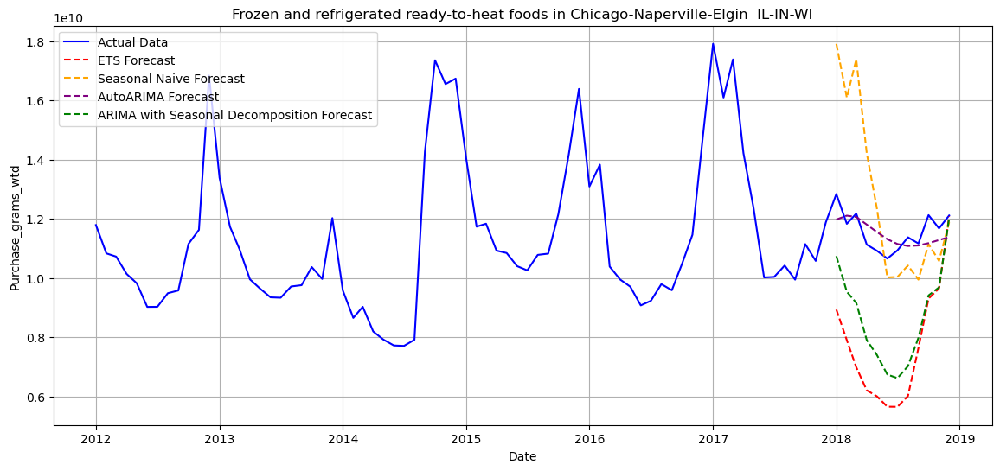

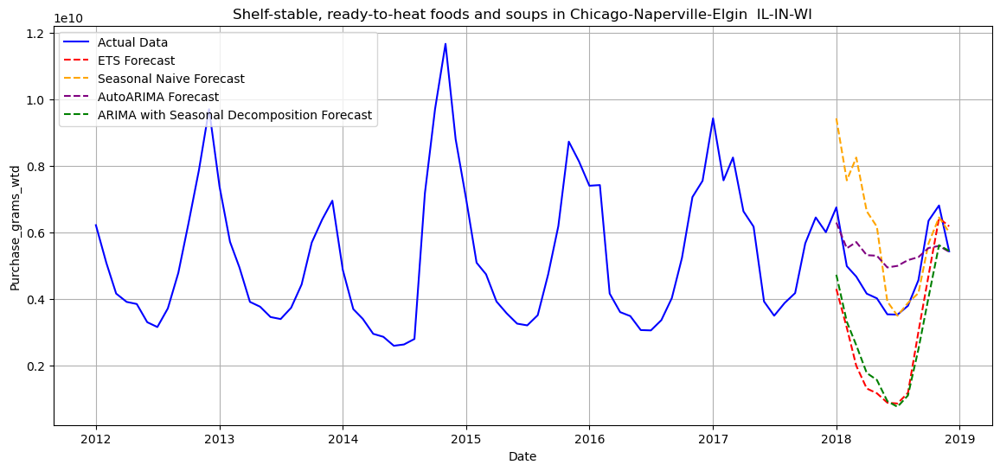

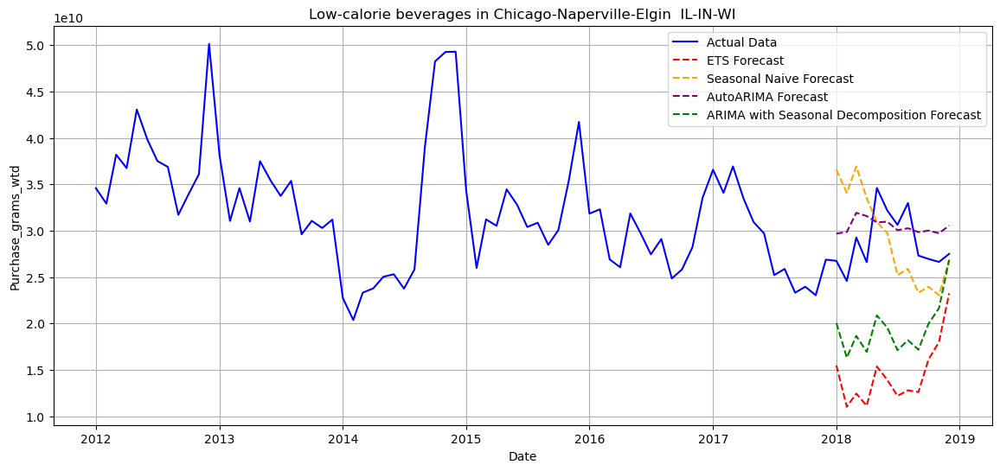

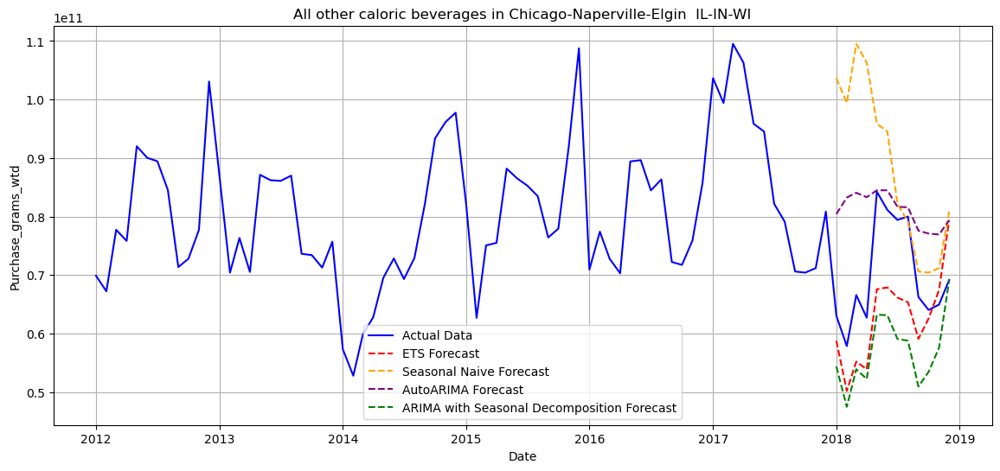

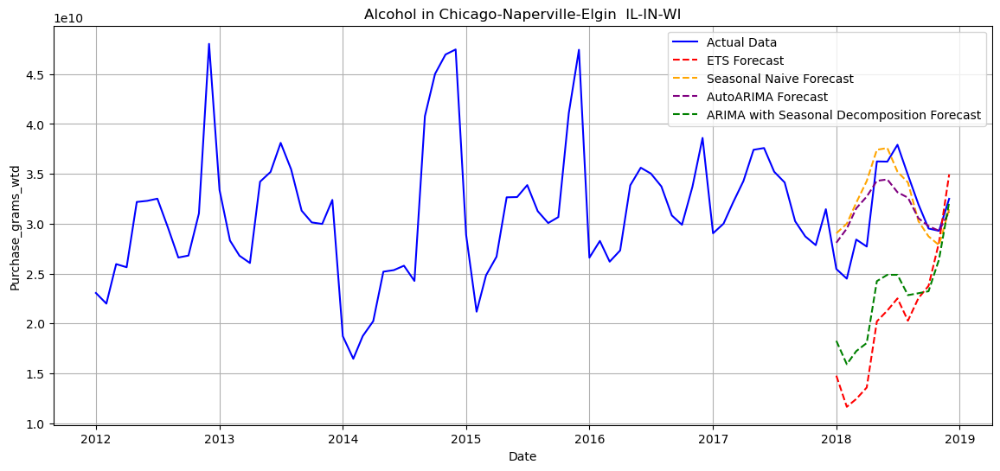

In [11]:
target_metroregion = 'Chicago-Naperville-Elgin  IL-IN-WI'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in 'Chicago-Naperville-Elgin  IL-IN-WI'

In [12]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Chicago-Naperville-Elgin IL-IN-WI,2.824865e+09,2.957585e+09,1.750721e+09,9.504844e+08,1.100656e+09,1.161781e+09,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",1.046163e+09,1.261506e+09,Seasonal Naive
1,Cheese and cream cheese,Chicago-Naperville-Elgin IL-IN-WI,2.029728e+09,2.177871e+09,6.224817e+08,6.673149e+08,1.636722e+08,2.001131e+08,"{'Order': (0, 1, 0), 'Seasonal_Order': (1, 0, ...",1.427814e+09,1.524534e+09,AutoARIMA
2,"Beef, pork, lamb, veal and game, fresh",Chicago-Naperville-Elgin IL-IN-WI,6.944989e+08,1.036634e+09,2.701536e+09,NaN,1.483907e+09,1.523129e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",1.360231e+09,1.465051e+09,ETS
3,"Bacon, sausage, and lunch meats",Chicago-Naperville-Elgin IL-IN-WI,1.502108e+09,1.635760e+09,2.171674e+09,5.984182e+08,1.459735e+09,1.808465e+09,"{'Order': (1, 0, 1), 'Seasonal_Order': (1, 0, ...",1.903780e+09,2.048234e+09,Seasonal Naive
4,Egg and egg substitutes,Chicago-Naperville-Elgin IL-IN-WI,1.683513e+09,1.827913e+09,9.437222e+08,1.298752e+09,2.586800e+08,3.332977e+08,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",1.159769e+09,1.284251e+09,AutoARIMA
5,Frozen and refrigerated ready-to-heat foods,Chicago-Naperville-Elgin IL-IN-WI,3.912017e+09,4.207658e+09,2.091351e+09,1.108288e+09,4.885425e+08,5.657266e+08,"{'Order': (4, 0, 0), 'Seasonal_Order': (0, 0, ...",2.894127e+09,3.110008e+09,AutoARIMA
6,"Shelf-stable, ready-to-heat foods and soups",Chicago-Naperville-Elgin IL-IN-WI,2.078855e+09,2.230021e+09,1.329817e+09,1.294532e+09,9.543194e+08,1.048130e+09,"{'Order': (3, 0, 0), 'Seasonal_Order': (0, 0, ...",2.019889e+09,2.151665e+09,AutoARIMA
7,Low-calorie beverages,Chicago-Naperville-Elgin IL-IN-WI,1.430604e+10,1.502927e+10,5.311222e+09,NaN,2.981747e+09,3.238139e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",9.385678e+09,1.018396e+10,AutoARIMA
8,All other caloric beverages,Chicago-Naperville-Elgin IL-IN-WI,9.274774e+09,1.037512e+10,1.882833e+10,1.329255e+09,1.123317e+10,1.366547e+10,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",1.301418e+10,1.439006e+10,Seasonal Naive
9,Alcohol,Chicago-Naperville-Elgin IL-IN-WI,1.111322e+10,1.222562e+10,2.523796e+09,7.611117e+08,2.458240e+09,2.964657e+09,"{'Order': (1, 0, 4), 'Seasonal_Order': (1, 0, ...",8.622482e+09,9.394419e+09,Seasonal Naive


## 'Dallas-Fort Worth-Arlington  TX'


Processing Metroregion: Dallas-Fort Worth-Arlington  TX



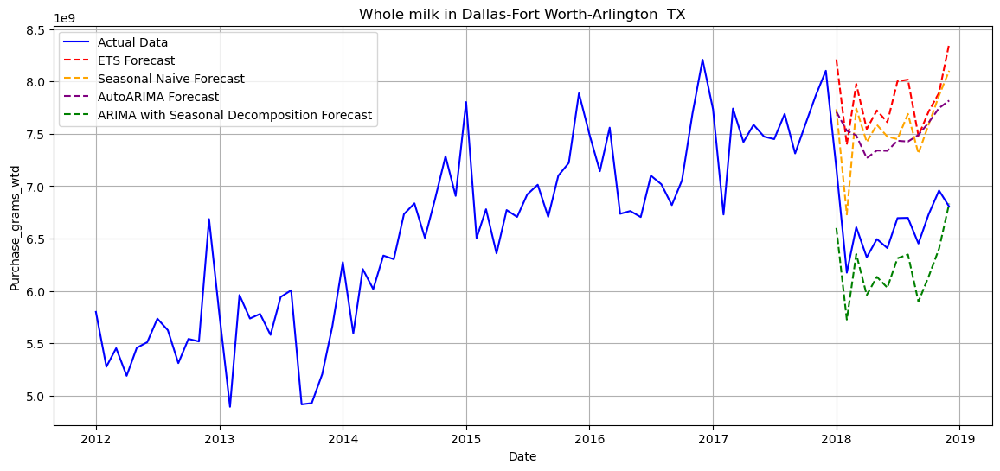

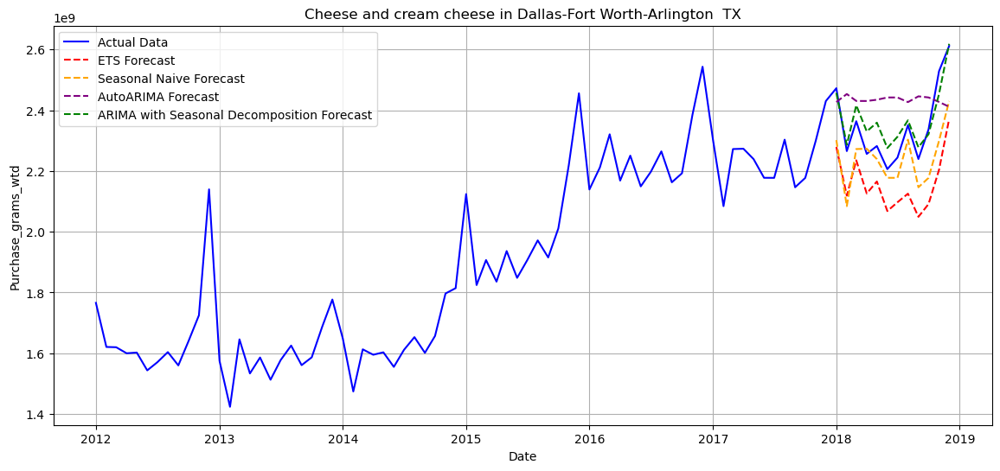

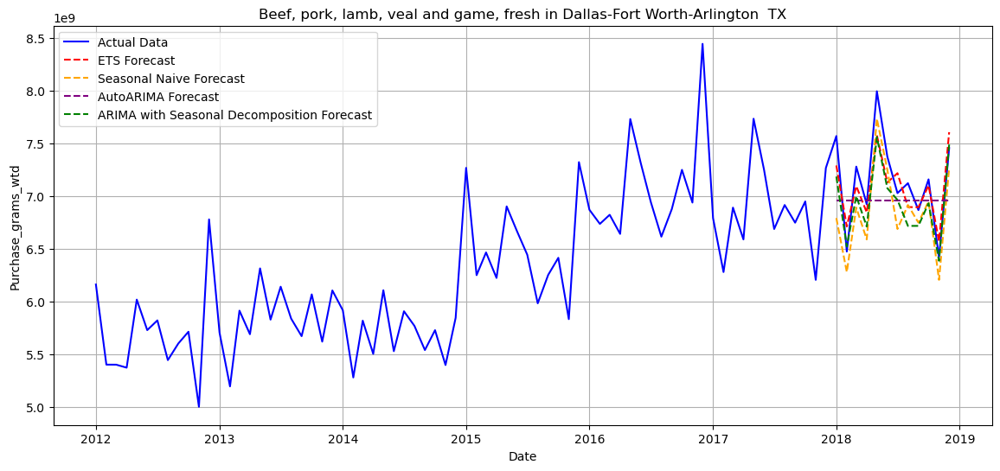

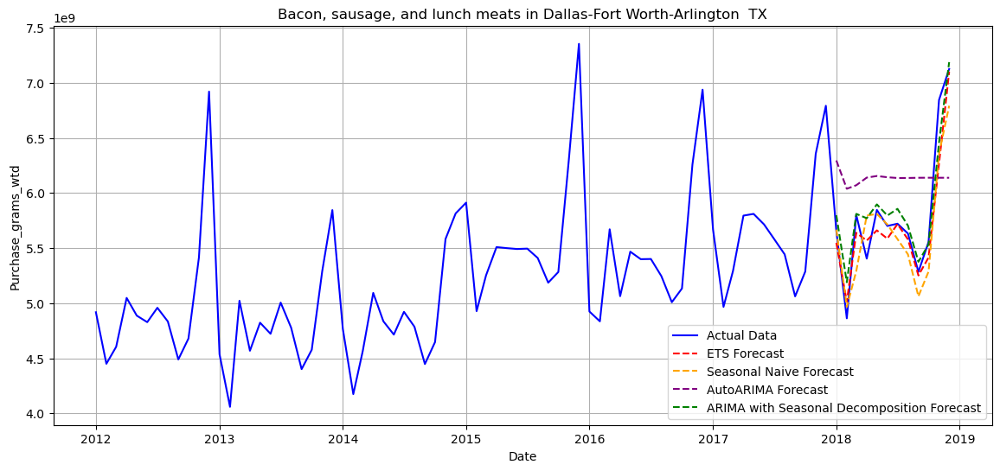

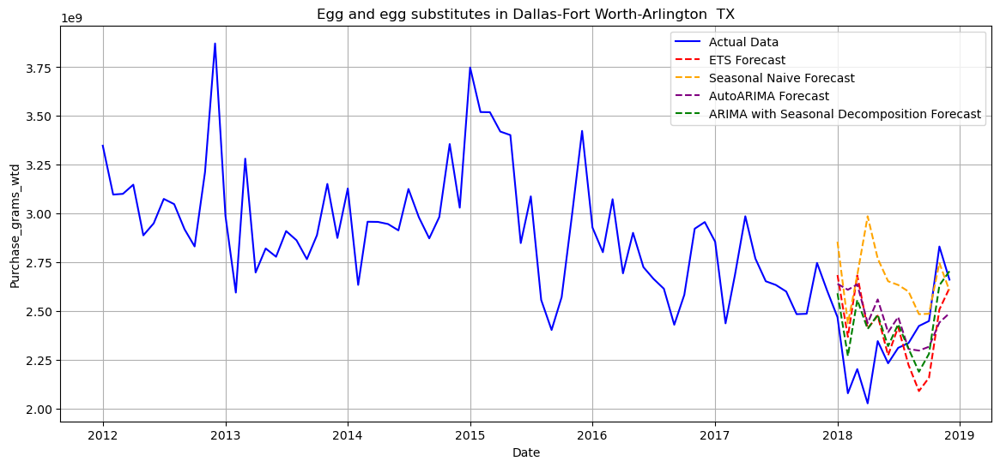

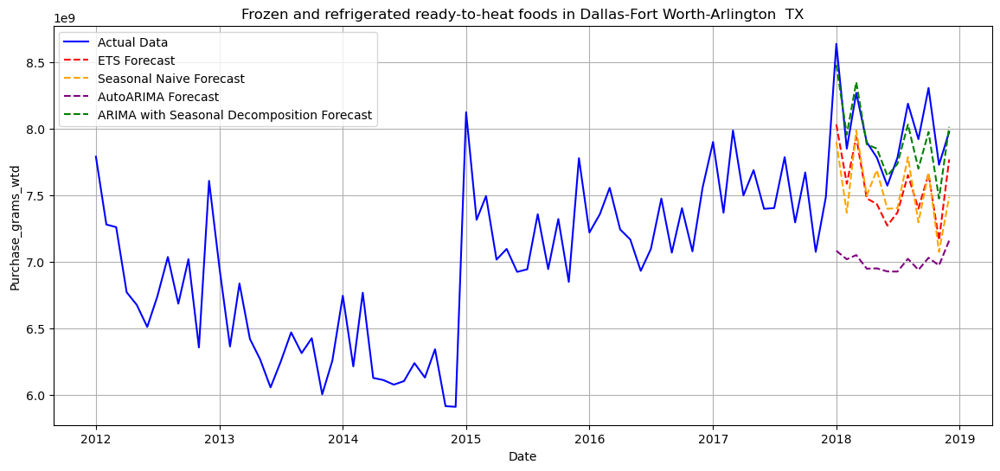

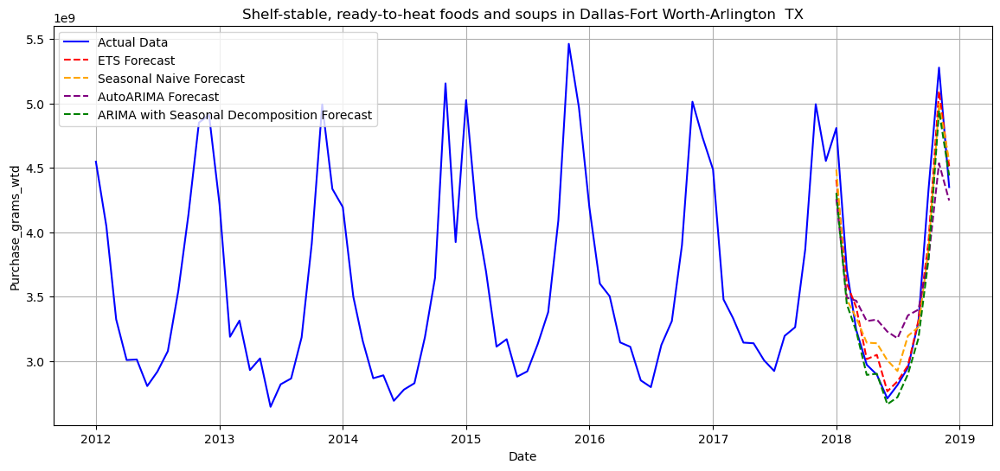

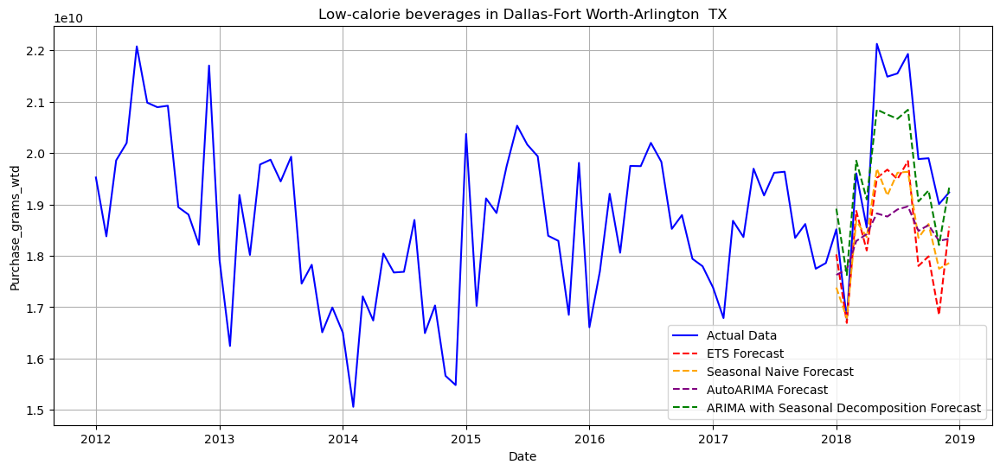

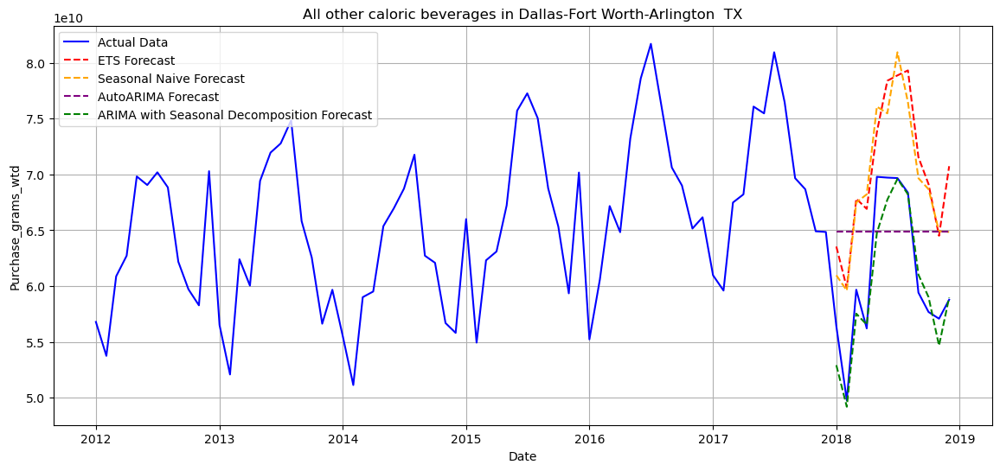

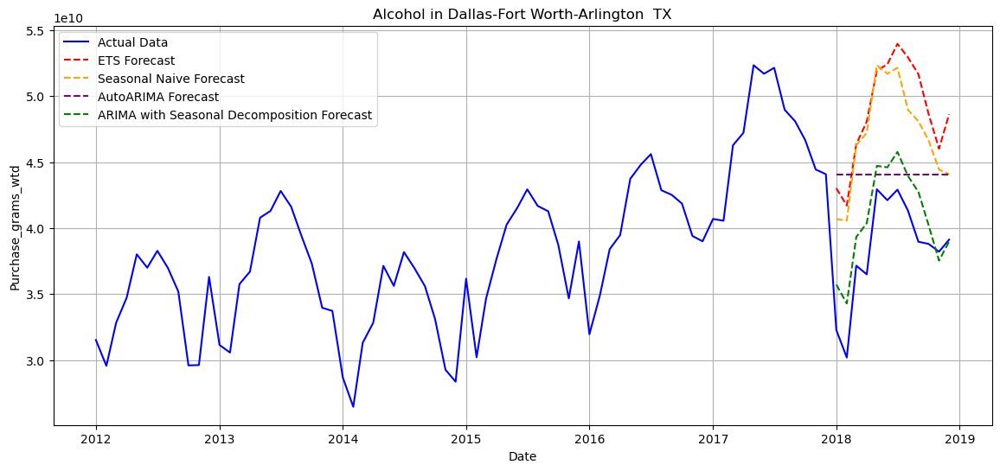

In [13]:
target_metroregion = 'Dallas-Fort Worth-Arlington  TX'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in 'Dallas-Fort Worth-Arlington  TX' 

In [14]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Dallas-Fort Worth-Arlington TX,1.200230e+09,1.212513e+09,9.309707e+08,9.561604e+08,8.890552e+08,9.096398e+08,"{'Order': (0, 1, 1), 'Seasonal_Order': (2, 0, ...",4.034802e+08,4.316861e+08,ARIMA
1,Cheese and cream cheese,Dallas-Fort Worth-Arlington TX,1.856288e+08,1.952616e+08,1.091696e+08,1.290128e+08,1.457459e+08,1.580674e+08,"{'Order': (0, 1, 1), 'Seasonal_Order': (1, 0, ...",4.419214e+07,5.167854e+07,ARIMA
2,"Beef, pork, lamb, veal and game, fresh",Dallas-Fort Worth-Arlington TX,1.872304e+08,2.133512e+08,2.796434e+08,3.274013e+08,3.721360e+08,4.633170e+08,"{'Order': (0, 1, 1), 'Seasonal_Order': (0, 0, ...",2.138331e+08,2.575014e+08,ETS
3,"Bacon, sausage, and lunch meats",Dallas-Fort Worth-Arlington TX,1.429107e+08,2.025911e+08,2.257753e+08,2.815359e+08,6.350038e+08,6.870597e+08,"{'Order': (2, 1, 1), 'Seasonal_Order': (0, 0, ...",1.467605e+08,1.958561e+08,ARIMA
4,Egg and egg substitutes,Dallas-Fort Worth-Arlington TX,2.293343e+08,2.667194e+08,3.214011e+08,4.059432e+08,2.441463e+08,2.859622e+08,"{'Order': (1, 1, 3), 'Seasonal_Order': (1, 0, ...",1.725038e+08,2.020451e+08,ARIMA
5,Frozen and refrigerated ready-to-heat foods,Dallas-Fort Worth-Arlington TX,4.296247e+08,4.510518e+08,4.455915e+08,4.841605e+08,9.889554e+08,1.020285e+09,"{'Order': (1, 1, 0), 'Seasonal_Order': (2, 0, ...",1.288550e+08,1.588705e+08,ARIMA
6,"Shelf-stable, ready-to-heat foods and soups",Dallas-Fort Worth-Arlington TX,1.447632e+08,1.945627e+08,2.256421e+08,2.509283e+08,3.774095e+08,4.208729e+08,"{'Order': (1, 0, 2), 'Seasonal_Order': (1, 0, ...",1.791519e+08,2.539575e+08,ETS
7,Low-calorie beverages,Dallas-Fort Worth-Arlington TX,1.426358e+09,1.651678e+09,1.390829e+09,1.578701e+09,1.605600e+09,1.884489e+09,"{'Order': (3, 0, 1), 'Seasonal_Order': (1, 0, ...",6.990660e+08,7.708261e+08,ARIMA
8,All other caloric beverages,Dallas-Fort Worth-Arlington TX,9.320443e+09,9.597360e+09,8.395301e+09,NaN,6.825083e+09,7.425160e+09,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",1.610927e+09,2.172932e+09,ARIMA
9,Alcohol,Dallas-Fort Worth-Arlington TX,1.040600e+10,1.049049e+10,8.556801e+09,NaN,5.711695e+09,6.867665e+09,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",2.447514e+09,2.732866e+09,ARIMA


## 'Detroit-Warren-Dearborn  MI'


Processing Metroregion: Detroit-Warren-Dearborn  MI



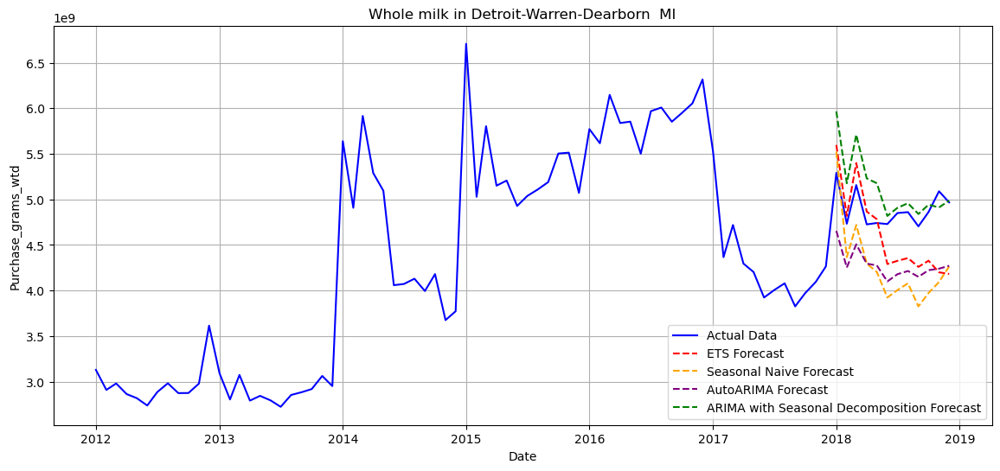

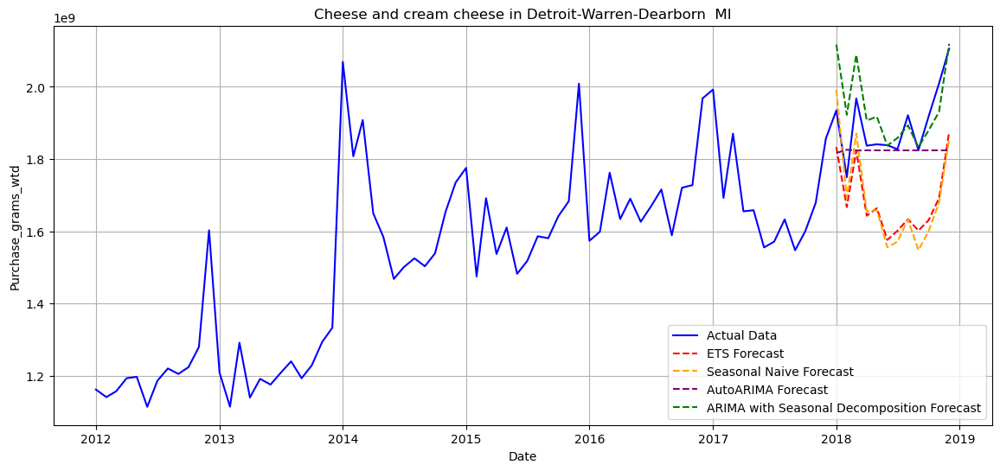

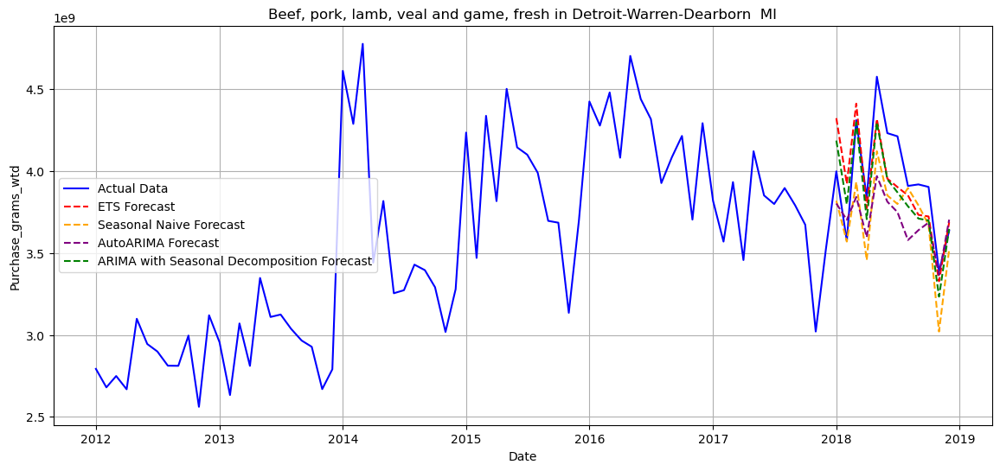

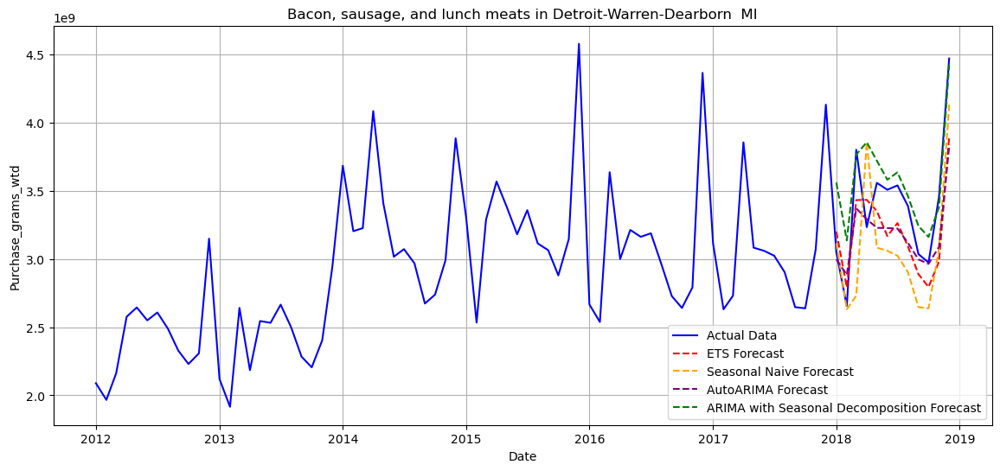

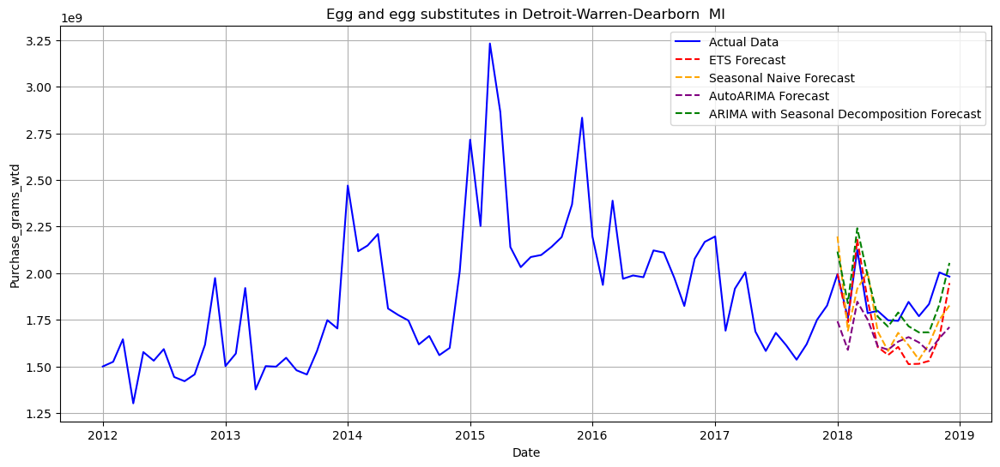

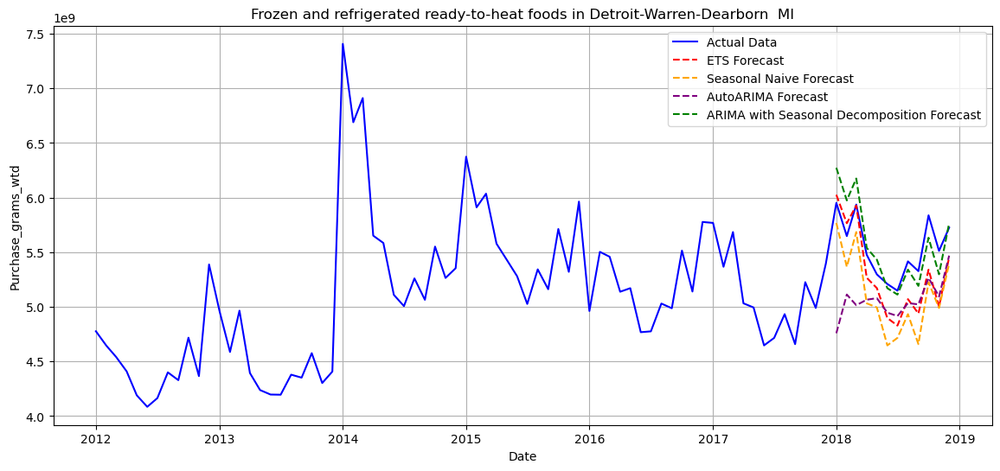

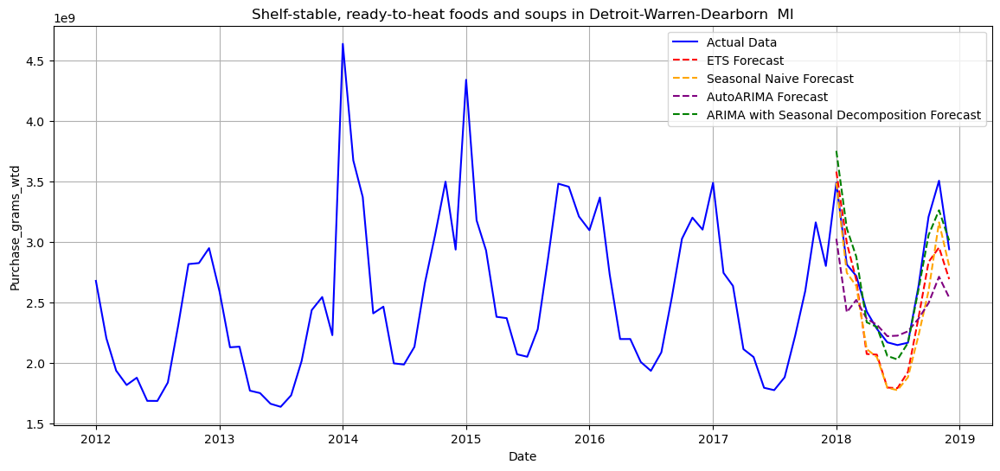

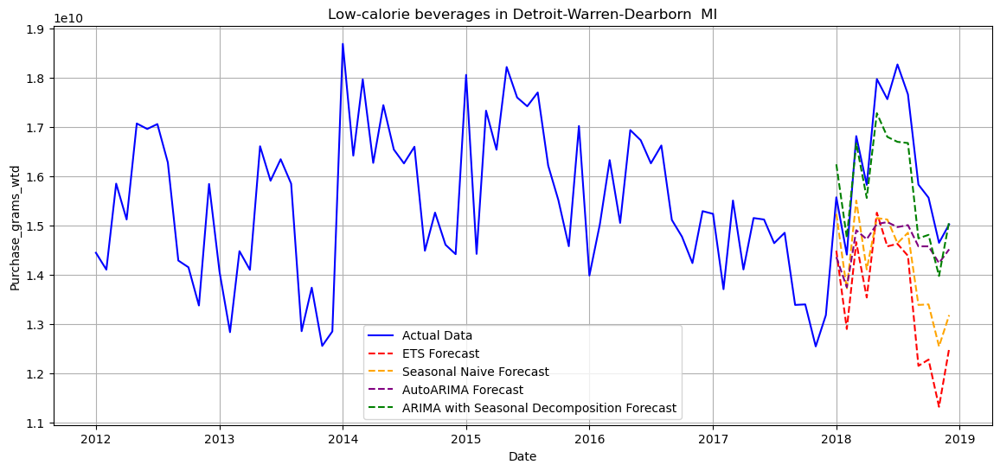

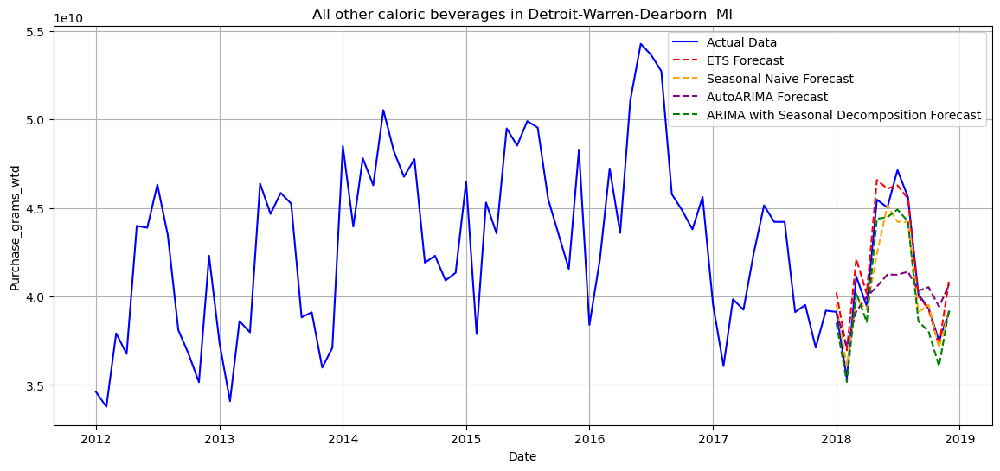

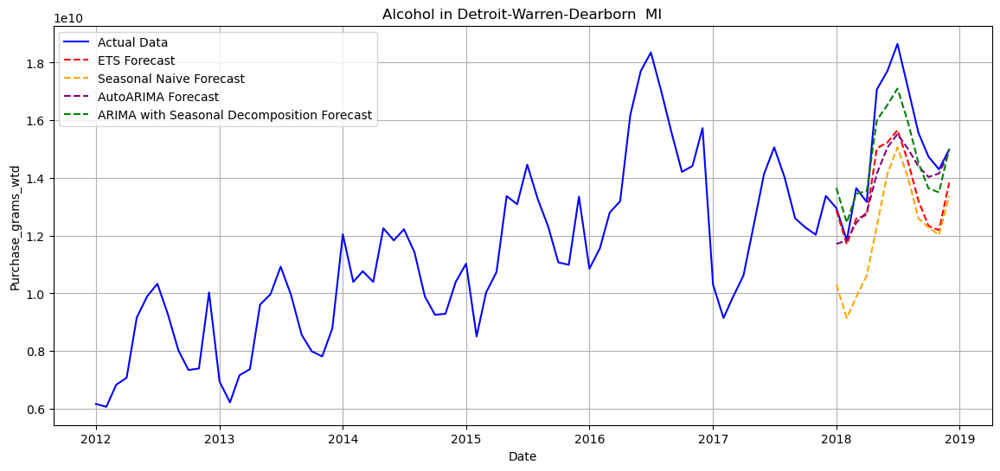

In [15]:
target_metroregion = 'Detroit-Warren-Dearborn  MI'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in'Detroit-Warren-Dearborn  MI'

In [16]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Detroit-Warren-Dearborn MI,4.114993e+08,4.825926e+08,6.590294e+08,7.001289e+08,6.125851e+08,6.224315e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (1, 0, ...",2.727442e+08,3.515852e+08,ARIMA
1,Cheese and cream cheese,Detroit-Warren-Dearborn MI,2.109503e+08,2.225994e+08,2.146866e+08,2.343405e+08,8.674973e+07,1.198755e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (0, 0, ...",6.845564e+07,9.035609e+07,ARIMA
2,"Beef, pork, lamb, veal and game, fresh",Detroit-Warren-Dearborn MI,1.847762e+08,2.154333e+08,2.533578e+08,2.968951e+08,2.863204e+08,3.326123e+08,"{'Order': (0, 1, 0), 'Seasonal_Order': (2, 0, ...",1.798212e+08,2.041336e+08,ARIMA
3,"Bacon, sausage, and lunch meats",Detroit-Warren-Dearborn MI,2.799515e+08,3.102766e+08,4.303168e+08,4.999840e+08,2.526252e+08,3.109082e+08,"{'Order': (2, 1, 0), 'Seasonal_Order': (2, 0, ...",2.146511e+08,2.910186e+08,ARIMA
4,Egg and egg substitutes,Detroit-Warren-Dearborn MI,1.621878e+08,2.025117e+08,1.772179e+08,1.879114e+08,2.003272e+08,2.166563e+08,"{'Order': (0, 1, 1), 'Seasonal_Order': (2, 0, ...",1.033698e+08,1.158020e+08,ARIMA
5,Frozen and refrigerated ready-to-heat foods,Detroit-Warren-Dearborn MI,2.648437e+08,3.067129e+08,4.226388e+08,4.475075e+08,4.755113e+08,5.556383e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (1, 0, ...",1.525368e+08,1.838585e+08,ARIMA
6,"Shelf-stable, ready-to-heat foods and soups",Detroit-Warren-Dearborn MI,2.723327e+08,3.034814e+08,2.690538e+08,3.161636e+08,2.950640e+08,3.869440e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",1.295079e+08,1.598548e+08,ARIMA
7,Low-calorie beverages,Detroit-Warren-Dearborn MI,2.706311e+09,2.819978e+09,2.027063e+09,1.832710e+09,1.620598e+09,1.884172e+09,"{'Order': (1, 0, 2), 'Seasonal_Order': (0, 0, ...",6.686573e+08,7.847981e+08,ARIMA
8,All other caloric beverages,Detroit-Warren-Dearborn MI,8.112455e+08,9.866708e+08,9.732010e+08,6.425844e+08,2.333225e+09,2.972161e+09,"{'Order': (1, 0, 2), 'Seasonal_Order': (0, 0, ...",1.023074e+09,1.171549e+09,Seasonal Naive
9,Alcohol,Detroit-Warren-Dearborn MI,1.648876e+09,1.917734e+09,2.995825e+09,1.382736e+09,1.308818e+09,1.701840e+09,"{'Order': (0, 1, 0), 'Seasonal_Order': (2, 0, ...",8.192076e+08,9.261641e+08,ARIMA


##  'Houston-The Woodlands-Sugar Land  TX'


Processing Metroregion: Houston-The Woodlands-Sugar Land  TX



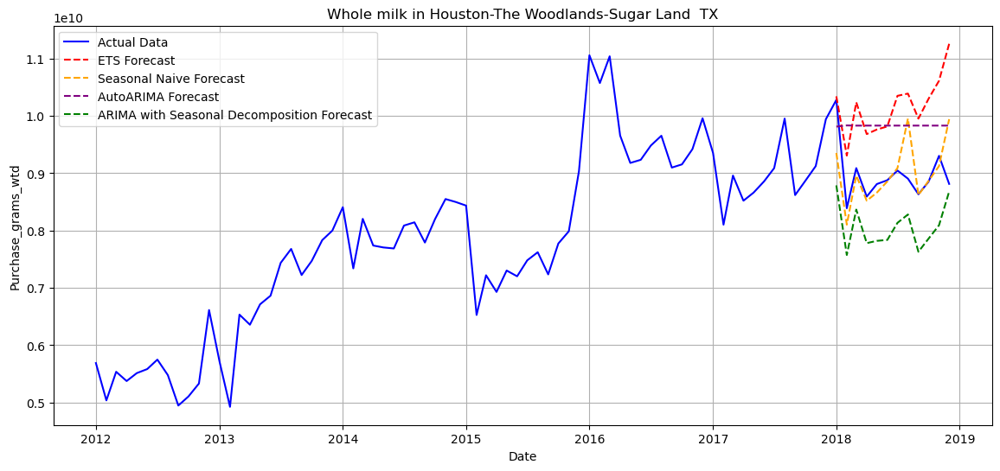

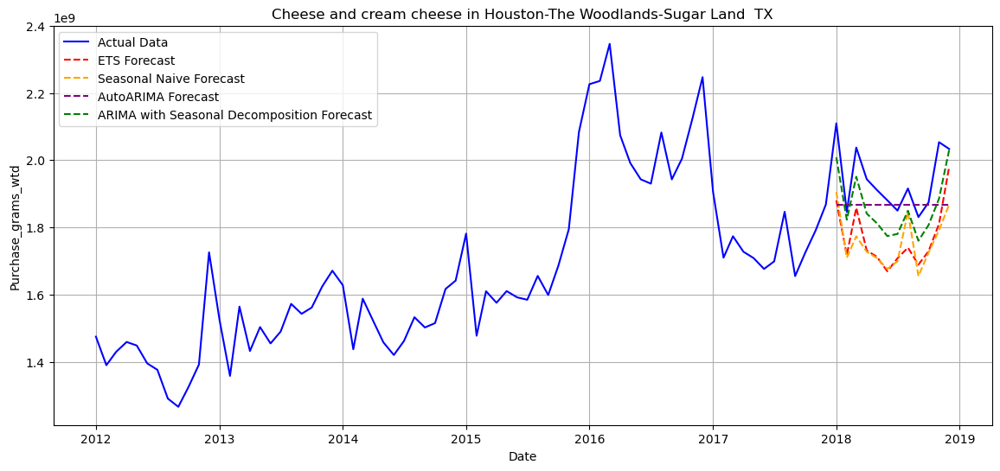

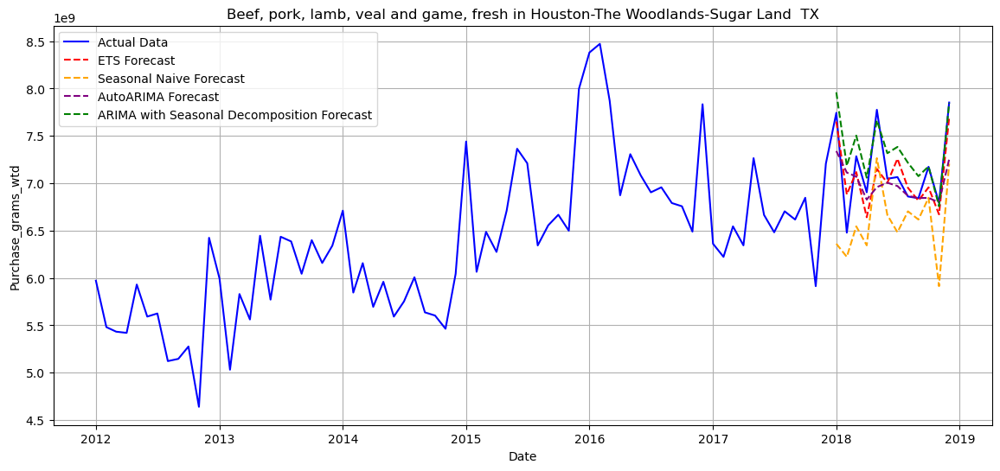

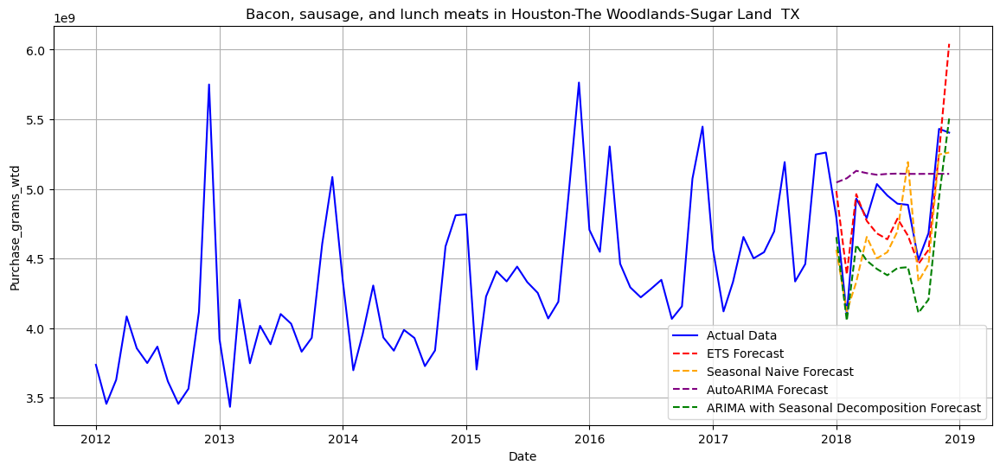

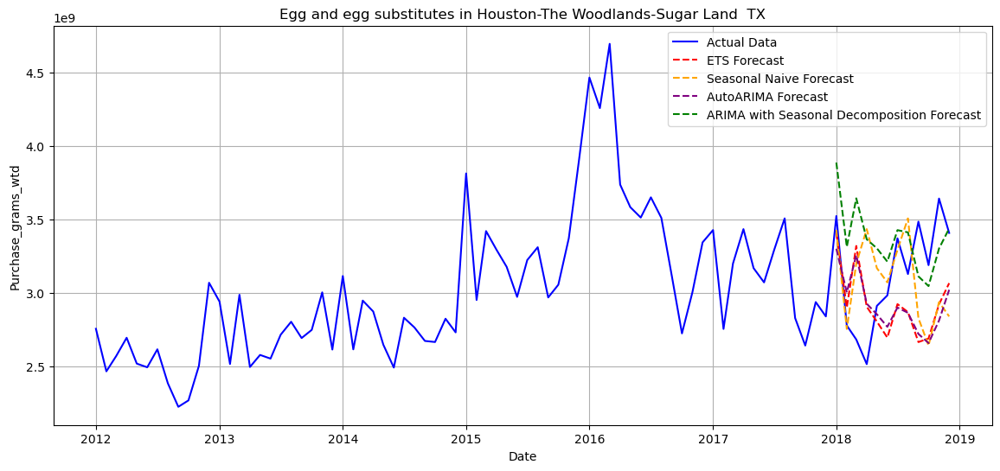

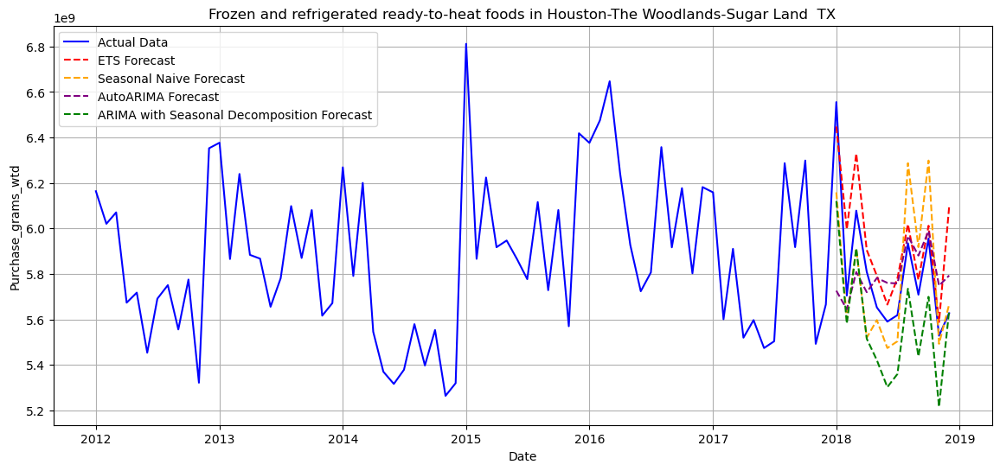

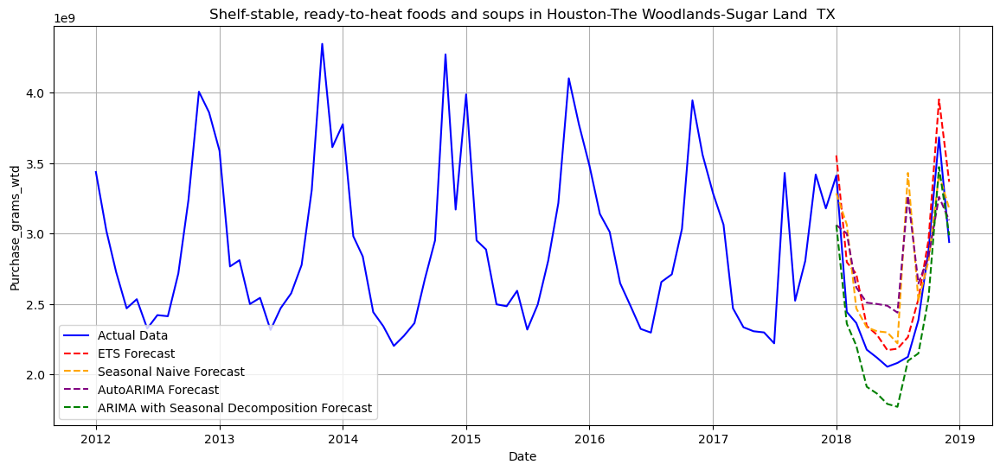

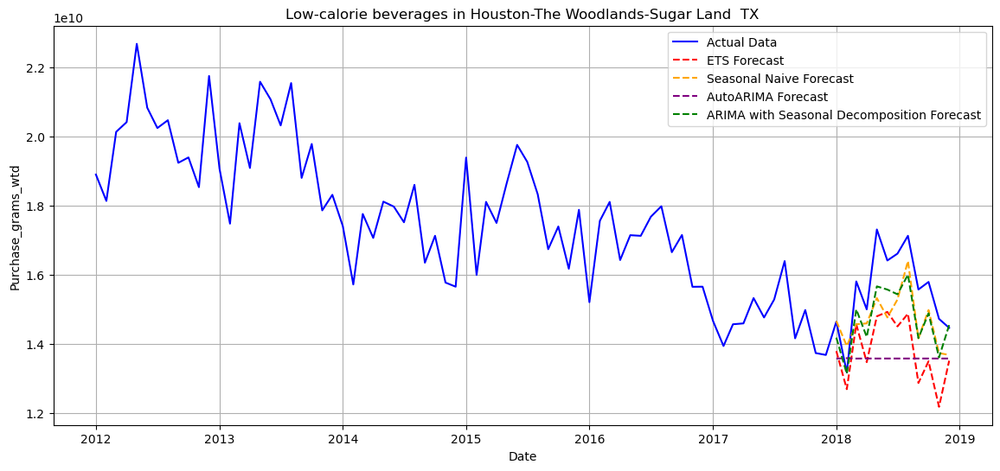

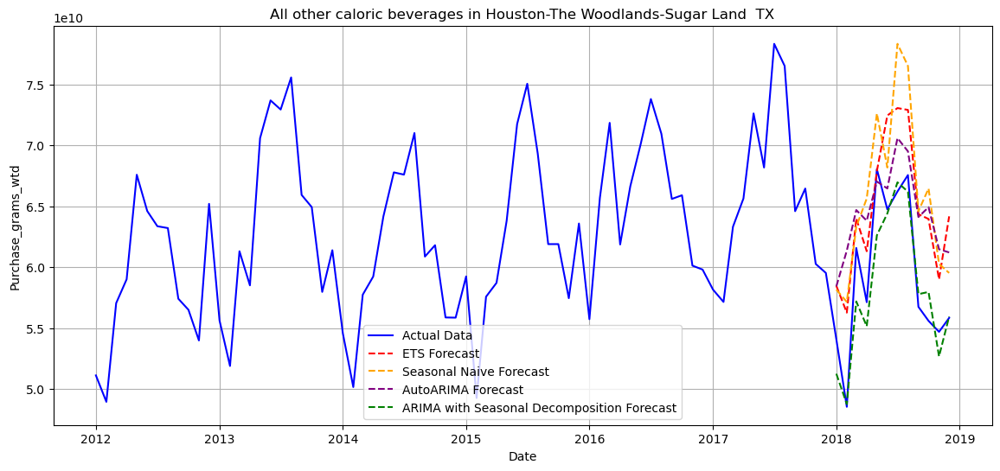

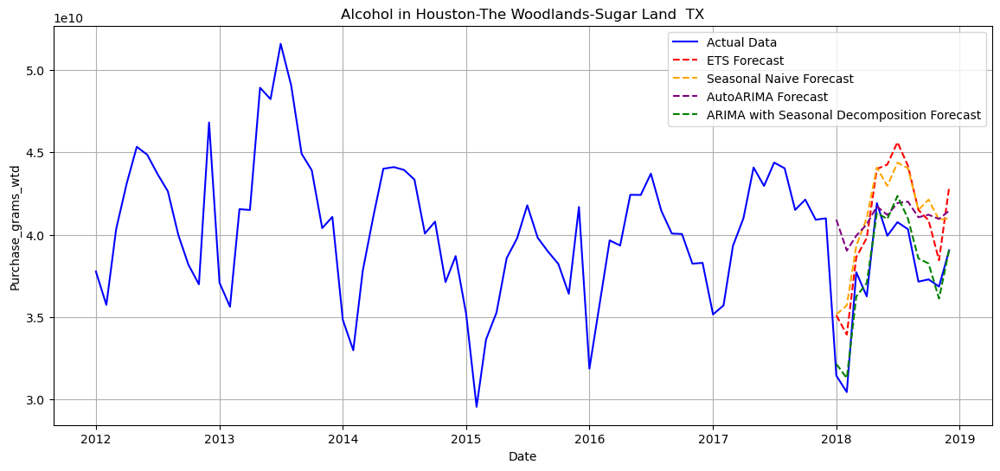

In [17]:
target_metroregion = 'Houston-The Woodlands-Sugar Land  TX'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in 'Houston-The Woodlands-Sugar Land  TX'

In [18]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Houston-The Woodlands-Sugar Land TX,1.201494e+09,1.309204e+09,3.342722e+08,5.316886e+08,9.413944e+08,9.797310e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (0, 0, ...",8.963651e+08,9.506706e+08,Seasonal Naive
1,Cheese and cream cheese,Houston-The Woodlands-Sugar Land TX,1.718347e+08,1.791663e+08,1.833490e+08,1.906636e+08,8.539309e+07,1.158986e+08,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",8.030122e+07,8.985742e+07,ARIMA
2,"Beef, pork, lamb, veal and game, fresh",Houston-The Woodlands-Sugar Land TX,2.002503e+08,2.573806e+08,5.540676e+08,6.427644e+08,2.687456e+08,3.831637e+08,"{'Order': (0, 1, 1), 'Seasonal_Order': (1, 0, ...",2.188027e+08,2.865981e+08,ETS
3,"Bacon, sausage, and lunch meats",Houston-The Woodlands-Sugar Land TX,2.073460e+08,2.673959e+08,2.617732e+08,3.088042e+08,3.396188e+08,4.129788e+08,"{'Order': (2, 1, 0), 'Seasonal_Order': (0, 0, ...",3.641034e+08,4.049254e+08,ETS
4,Egg and egg substitutes,Houston-The Woodlands-Sugar Land TX,3.949127e+08,4.561307e+08,4.022908e+08,4.904572e+08,4.120535e+08,4.688027e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (1, 0, ...",3.791252e+08,4.674715e+08,ETS
5,Frozen and refrigerated ready-to-heat foods,Houston-The Woodlands-Sugar Land TX,1.546981e+08,1.953008e+08,1.853652e+08,2.233560e+08,1.926125e+08,2.806863e+08,"{'Order': (0, 0, 2), 'Seasonal_Order': (0, 0, ...",2.374361e+08,2.581585e+08,ETS
6,"Shelf-stable, ready-to-heat foods and soups",Houston-The Woodlands-Sugar Land TX,2.047787e+08,2.326942e+08,3.005190e+08,4.482620e+08,3.913514e+08,4.700838e+08,"{'Order': (1, 0, 2), 'Seasonal_Order': (1, 0, ...",2.130500e+08,2.377700e+08,ETS
7,Low-calorie beverages,Houston-The Woodlands-Sugar Land TX,1.746387e+09,1.888996e+09,1.009545e+09,1.135797e+09,2.043962e+09,2.292509e+09,"{'Order': (2, 1, 0), 'Seasonal_Order': (0, 0, ...",8.669221e+08,9.840952e+08,ARIMA
8,All other caloric beverages,Houston-The Woodlands-Sugar Land TX,5.614253e+09,6.142264e+09,6.663241e+09,5.806683e+08,5.404759e+09,6.327505e+09,"{'Order': (2, 0, 1), 'Seasonal_Order': (2, 0, ...",1.902727e+09,2.482986e+09,Seasonal Naive
9,Alcohol,Houston-The Woodlands-Sugar Land TX,3.335409e+09,3.523495e+09,3.580709e+09,1.347546e+09,3.604015e+09,4.528597e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",9.019984e+08,9.921982e+08,ARIMA


## 'Los Angeles-Long Beach-Anaheim  CA'


Processing Metroregion: Los Angeles-Long Beach-Anaheim  CA



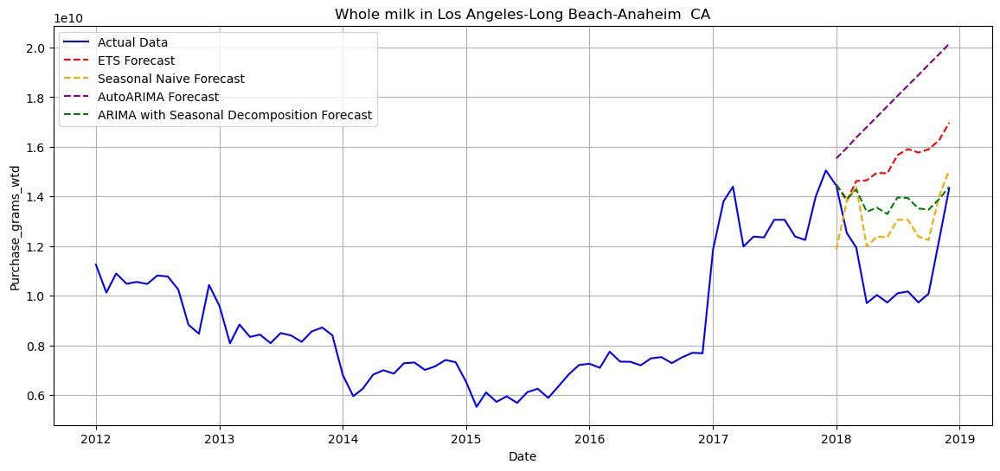

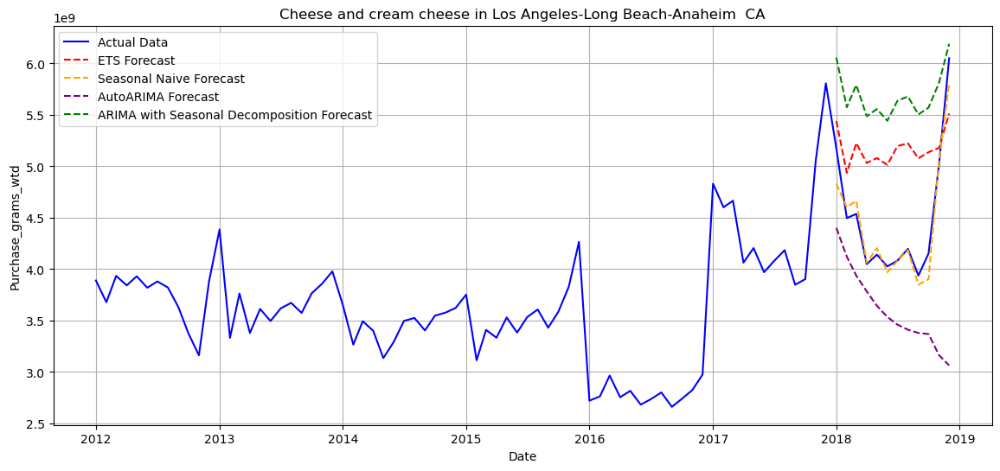

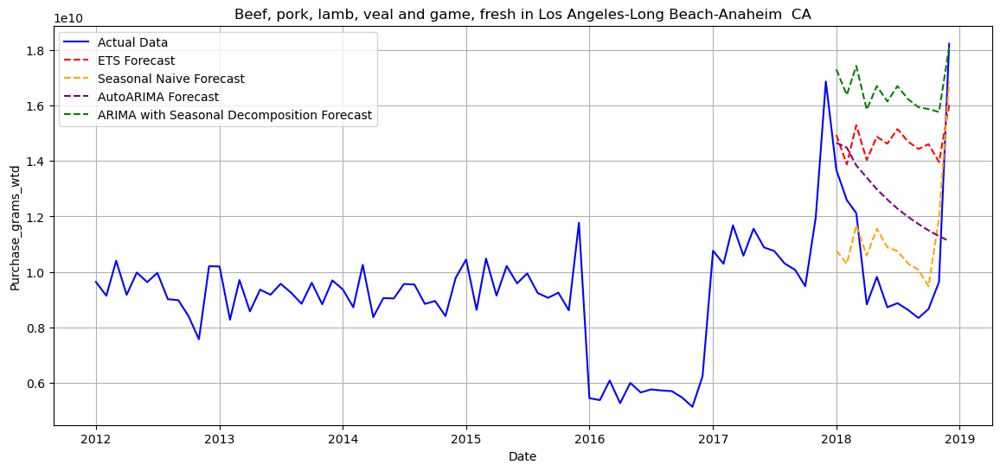

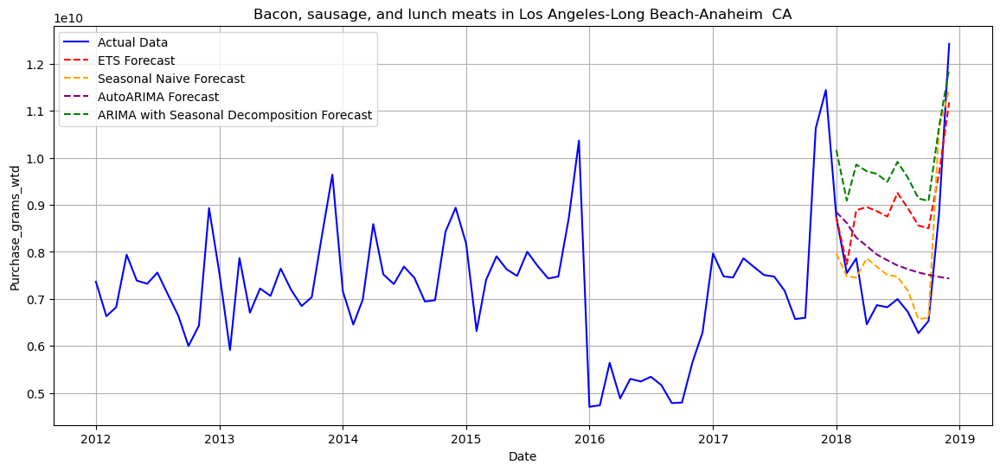

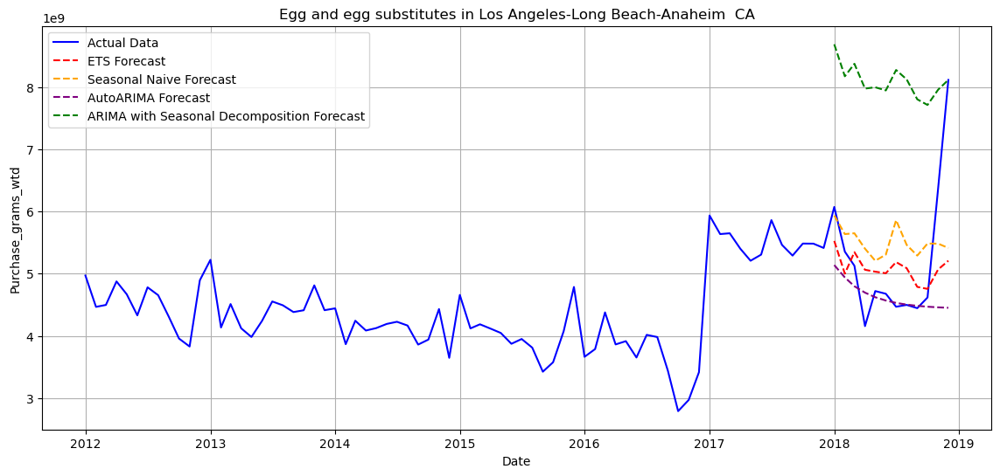

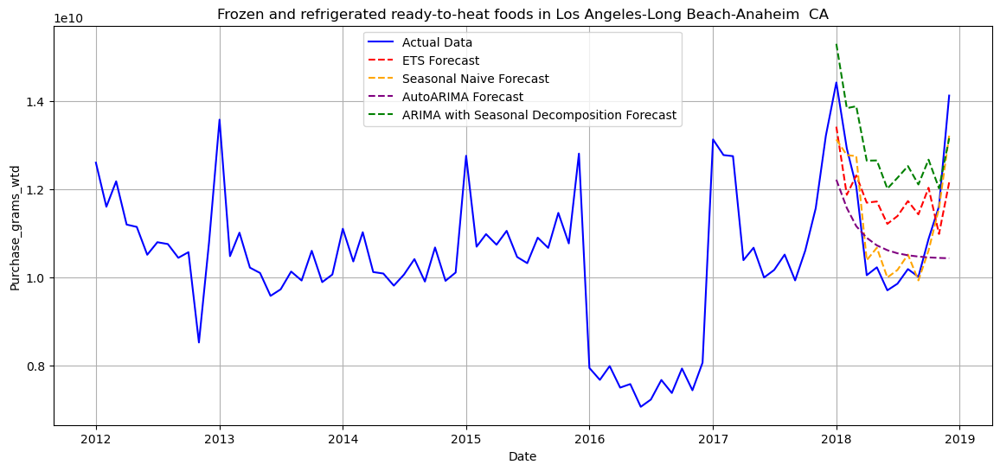

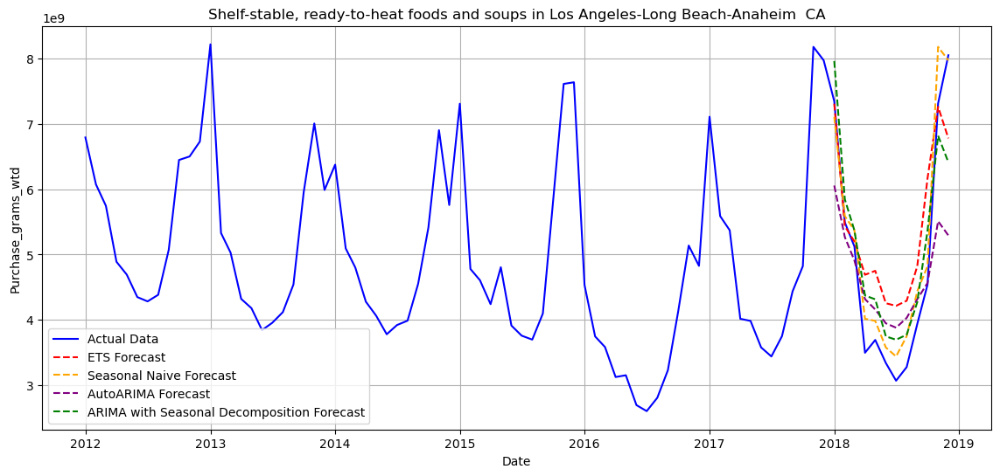

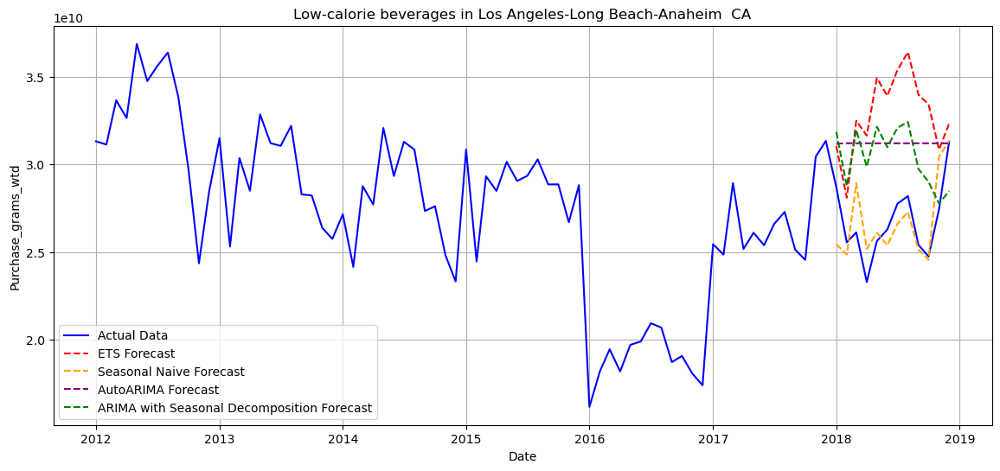

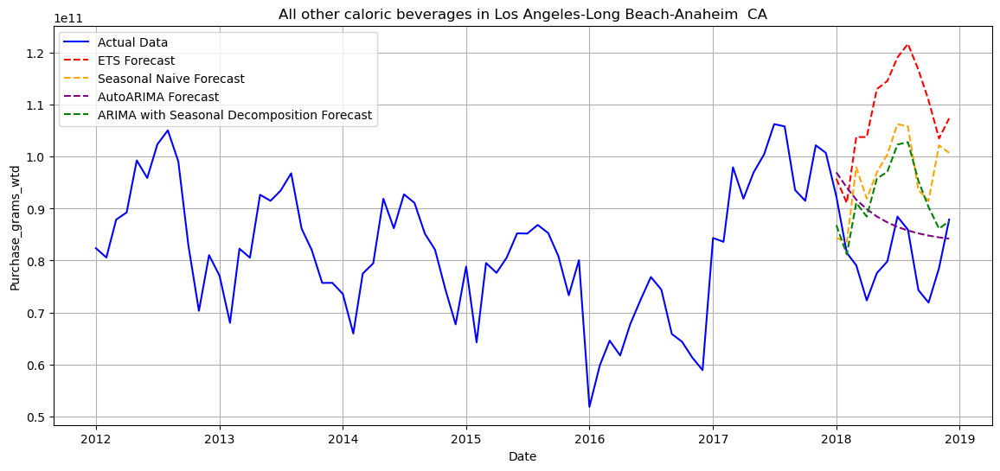

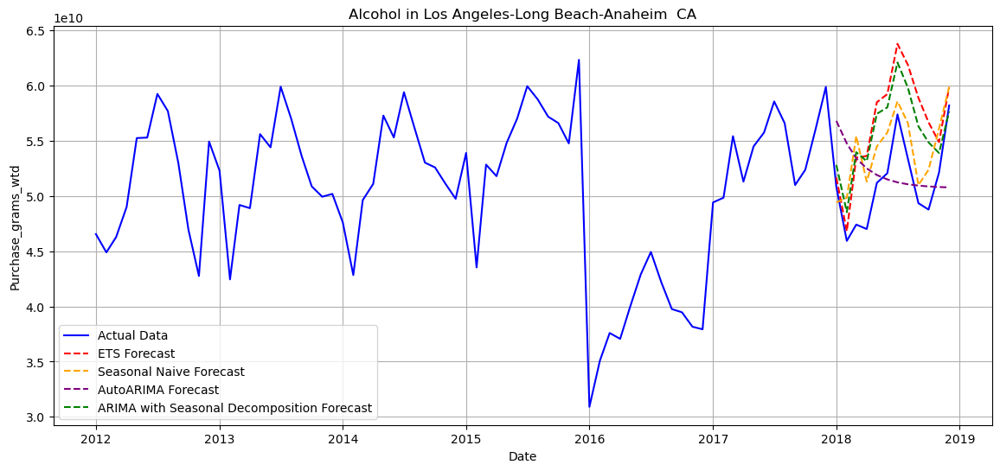

In [19]:
target_metroregion = 'Los Angeles-Long Beach-Anaheim  CA'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in 'Los Angeles-Long Beach-Anaheim  CA'

In [20]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Los Angeles-Long Beach-Anaheim CA,4.079202e+09,4.493229e+09,2.228513e+09,2.317850e+09,6.594276e+09,7.004499e+09,"{'Order': (0, 2, 2), 'Seasonal_Order': (0, 0, ...",2.587731e+09,2.939725e+09,Seasonal Naive
1,Cheese and cream cheese,Los Angeles-Long Beach-Anaheim CA,7.723464e+08,8.386820e+08,1.121113e+08,1.537808e+08,8.829170e+08,1.153082e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (2, 0, ...",1.203346e+09,1.268921e+09,Seasonal Naive
2,"Beef, pork, lamb, veal and game, fresh",Los Angeles-Long Beach-Anaheim CA,4.403705e+09,4.774904e+09,1.759340e+09,1.872061e+09,3.166384e+09,3.529969e+09,"{'Order': (2, 0, 0), 'Seasonal_Order': (0, 0, ...",5.882847e+09,6.289628e+09,Seasonal Naive
3,"Bacon, sausage, and lunch meats",Los Angeles-Long Beach-Anaheim CA,1.537221e+09,1.740636e+09,6.874205e+08,8.496125e+08,1.299368e+09,1.754603e+09,"{'Order': (2, 0, 2), 'Seasonal_Order': (0, 0, ...",2.270313e+09,2.397070e+09,Seasonal Naive
4,Egg and egg substitutes,Los Angeles-Long Beach-Anaheim CA,7.226152e+08,1.027328e+09,9.142332e+08,1.118091e+09,6.882304e+08,1.244874e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",2.879358e+09,3.062603e+09,ETS
5,Frozen and refrigerated ready-to-heat foods,Los Angeles-Long Beach-Anaheim CA,1.266640e+09,1.345849e+09,4.286088e+08,5.529794e+08,1.121036e+09,1.450103e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",1.744846e+09,1.888186e+09,Seasonal Naive
6,"Shelf-stable, ready-to-heat foods and soups",Los Angeles-Long Beach-Anaheim CA,7.788583e+08,9.490543e+08,3.503647e+08,4.070233e+08,8.472309e+08,1.128625e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (2, 0, ...",6.286272e+08,7.221795e+08,Seasonal Naive
7,Low-calorie beverages,Los Angeles-Long Beach-Anaheim CA,6.170469e+09,6.793252e+09,1.298193e+09,1.166467e+09,4.516621e+09,4.934963e+09,"{'Order': (1, 1, 0), 'Seasonal_Order': (0, 0, ...",4.192109e+09,4.507890e+09,Seasonal Naive
8,All other caloric beverages,Los Angeles-Long Beach-Anaheim CA,2.764515e+10,2.988197e+10,1.681144e+10,1.859193e+09,8.458248e+09,9.846862e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",1.230528e+10,1.409338e+10,Seasonal Naive
9,Alcohol,Los Angeles-Long Beach-Anaheim CA,5.471376e+09,6.219001e+09,3.327027e+09,NaN,4.038117e+09,4.896224e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",4.670346e+09,5.153773e+09,AutoARIMA


## 'Miami-Fort Lauderdale-West Palm Beach  FL'


Processing Metroregion: Miami-Fort Lauderdale-West Palm Beach  FL



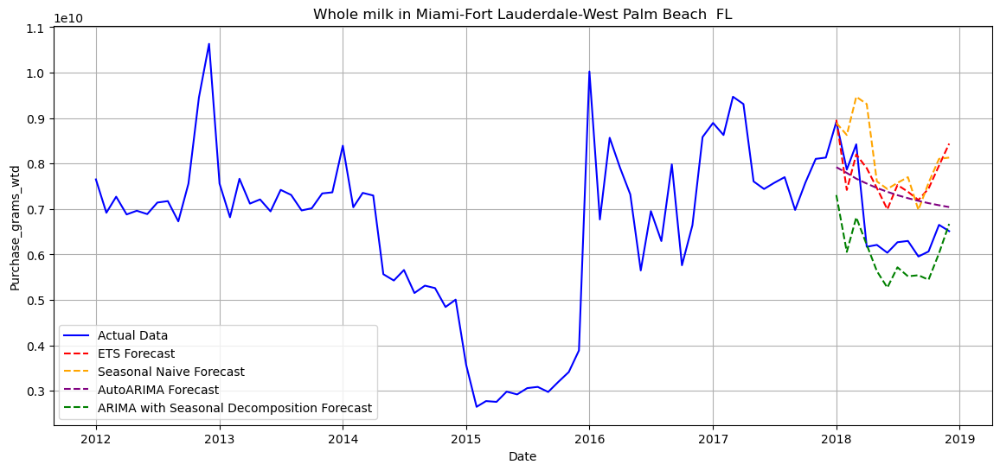

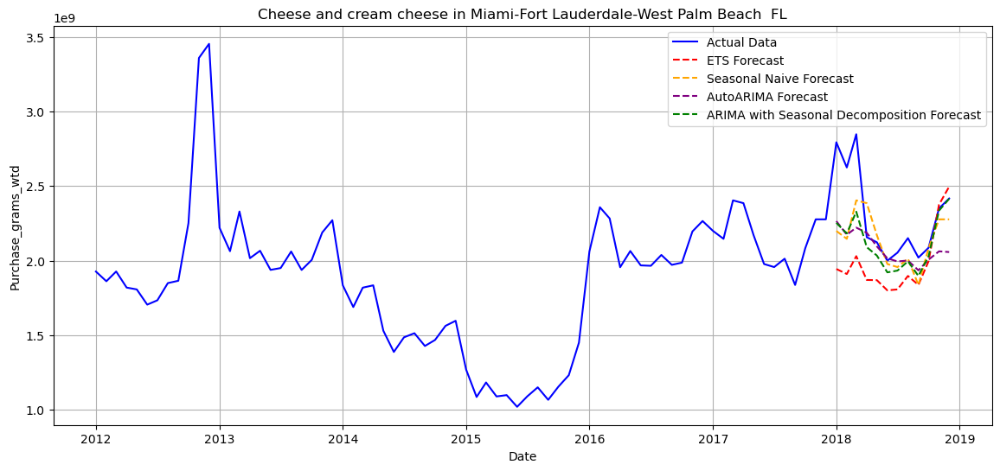

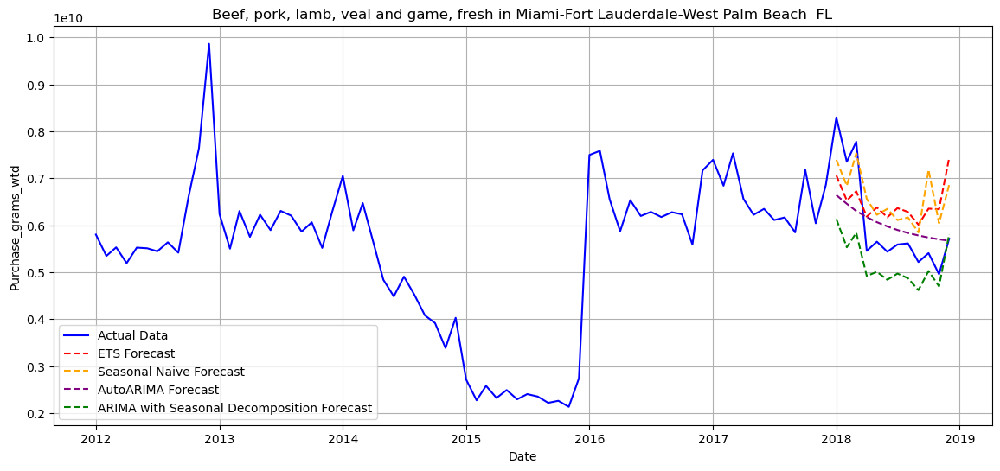

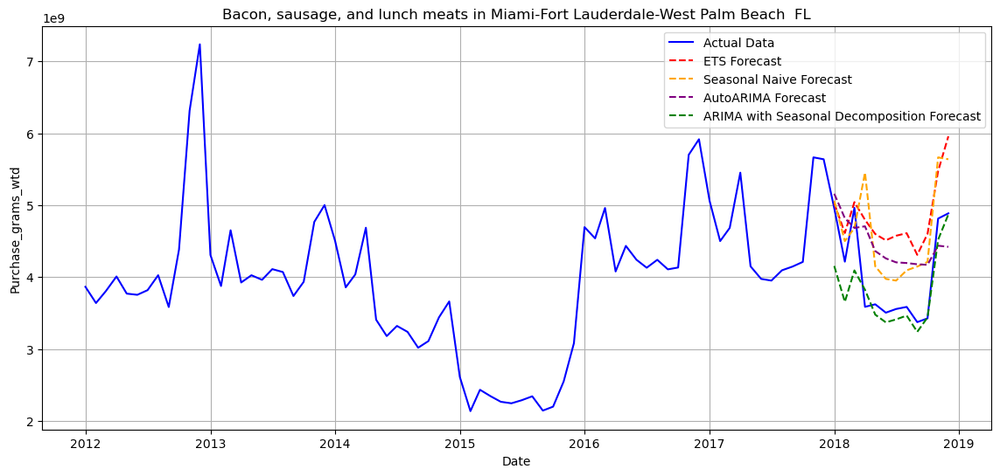

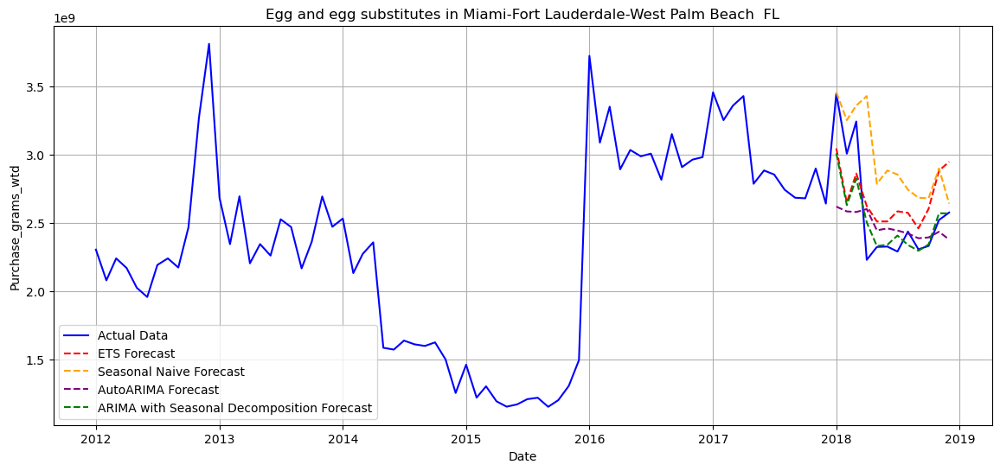

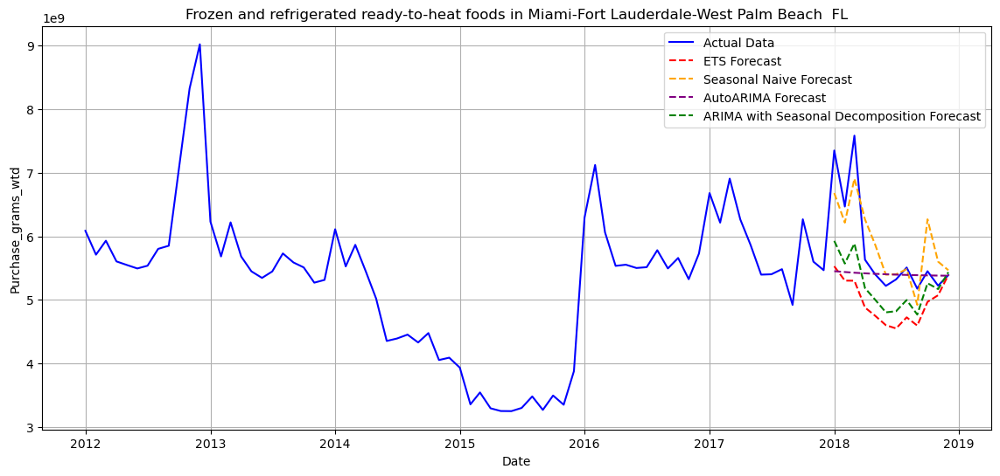

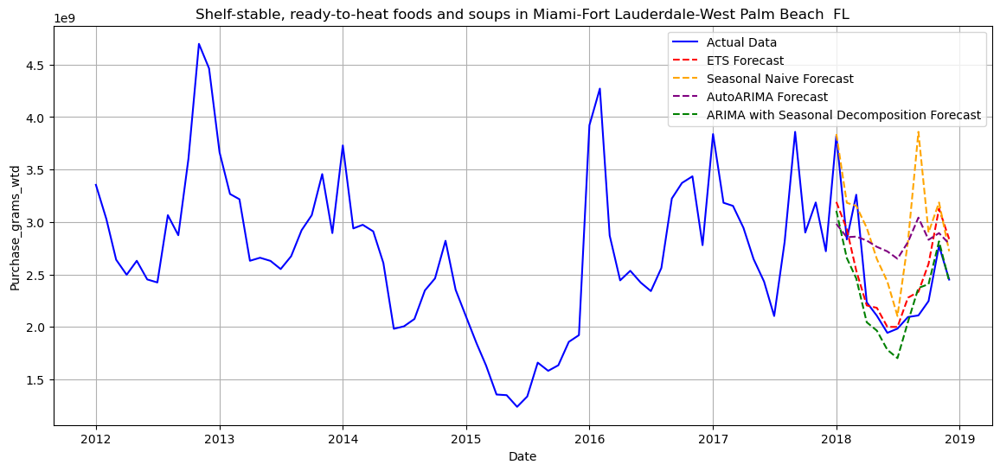

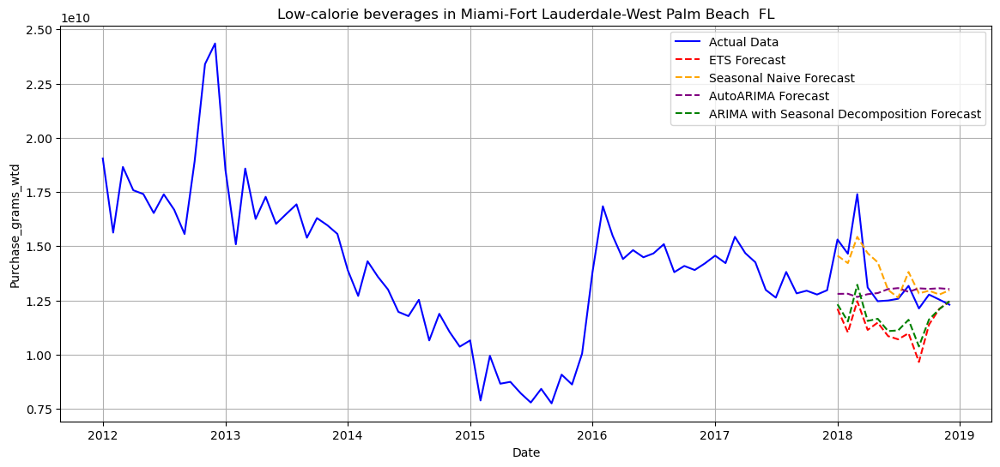

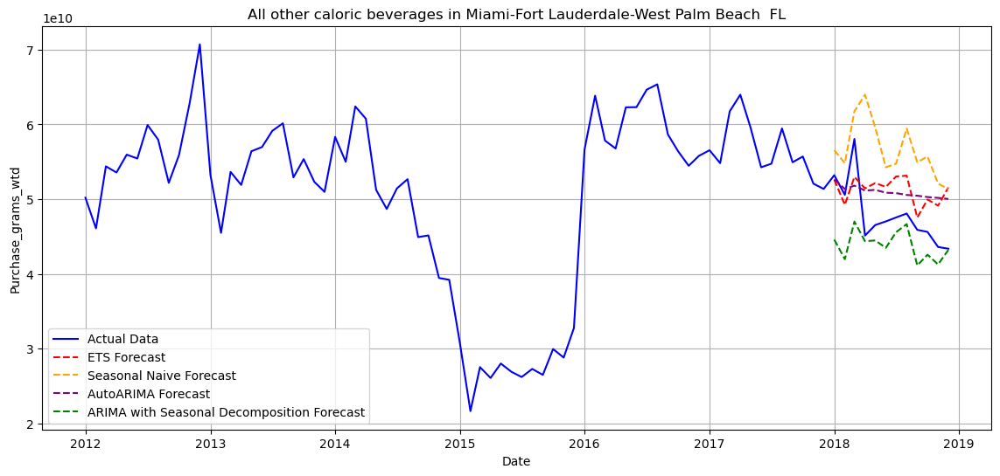

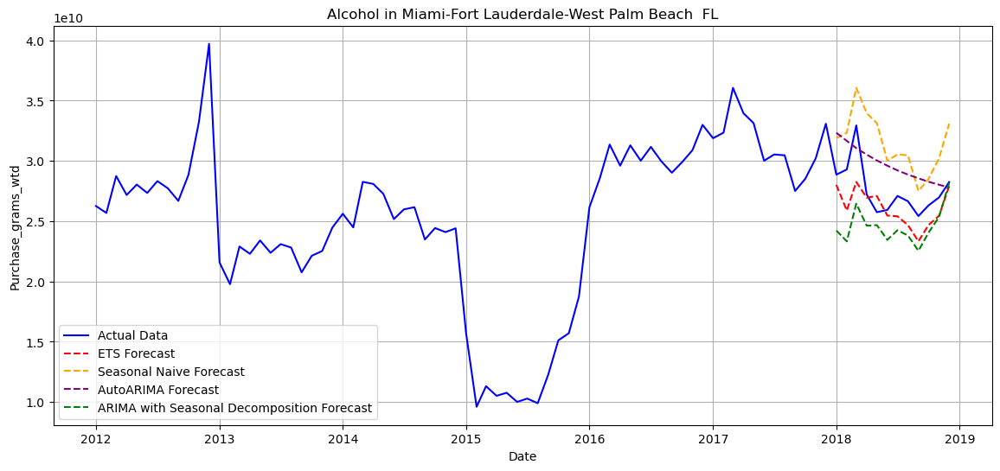

In [21]:
target_metroregion = 'Miami-Fort Lauderdale-West Palm Beach  FL'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in'Miami-Fort Lauderdale-West Palm Beach  FL' 

In [22]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Miami-Fort Lauderdale-West Palm Beach FL,1.070819e+09,1.202174e+09,1.340191e+09,8.530985e+08,9.198002e+08,9.969719e+08,"{'Order': (2, 0, 0), 'Seasonal_Order': (0, 0, ...",7.973365e+08,9.691489e+08,Seasonal Naive
1,Cheese and cream cheese,Miami-Fort Lauderdale-West Palm Beach FL,3.333742e+08,4.341406e+08,2.041423e+08,2.771164e+08,2.251056e+08,3.067449e+08,"{'Order': (1, 0, 2), 'Seasonal_Order': (1, 0, ...",1.841367e+08,2.636355e+08,ARIMA
2,"Beef, pork, lamb, veal and game, fresh",Miami-Fort Lauderdale-West Palm Beach FL,9.668577e+08,1.015782e+09,8.304055e+08,9.192498e+08,6.596514e+08,8.077665e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",8.656809e+08,1.092702e+09,AutoARIMA
3,"Bacon, sausage, and lunch meats",Miami-Fort Lauderdale-West Palm Beach FL,8.013407e+08,8.902173e+08,6.325340e+08,7.668210e+08,6.120026e+08,6.582489e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (1, 0, ...",2.888647e+08,4.027582e+08,ARIMA
4,Egg and egg substitutes,Miami-Fort Lauderdale-West Palm Beach FL,2.915419e+08,3.072879e+08,3.857791e+08,4.883667e+08,2.617011e+08,3.606329e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",1.518733e+08,2.259480e+08,ARIMA
5,Frozen and refrigerated ready-to-heat foods,Miami-Fort Lauderdale-West Palm Beach FL,8.382949e+08,1.042777e+09,3.756315e+08,4.569292e+08,5.106617e+08,8.889639e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",5.820345e+08,7.612169e+08,Seasonal Naive
6,"Shelf-stable, ready-to-heat foods and soups",Miami-Fort Lauderdale-West Palm Beach FL,2.612318e+08,3.447413e+08,5.112856e+08,6.727379e+08,5.534180e+08,6.152185e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (1, 0, ...",2.493857e+08,3.463939e+08,ETS
7,Low-calorie beverages,Miami-Fort Lauderdale-West Palm Beach FL,2.068698e+09,2.445340e+09,7.897451e+08,9.998442e+08,1.125876e+09,1.701355e+09,"{'Order': (1, 1, 0), 'Seasonal_Order': (0, 0, ...",1.715031e+09,2.049191e+09,Seasonal Naive
8,All other caloric beverages,Miami-Fort Lauderdale-West Palm Beach FL,4.487278e+09,4.966614e+09,8.718088e+09,NaN,4.200686e+09,4.657221e+09,"{'Order': (2, 0, 1), 'Seasonal_Order': (0, 0, ...",4.028320e+09,5.255876e+09,AutoARIMA
9,Alcohol,Miami-Fort Lauderdale-West Palm Beach FL,1.689039e+09,2.095226e+09,3.918948e+09,NaN,2.494527e+09,2.715084e+09,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 0, ...",2.978904e+09,3.480287e+09,ETS


## 'New York-Newark-Jersey City  NY-NJ-PA'


Processing Metroregion: New York-Newark-Jersey City  NY-NJ-PA



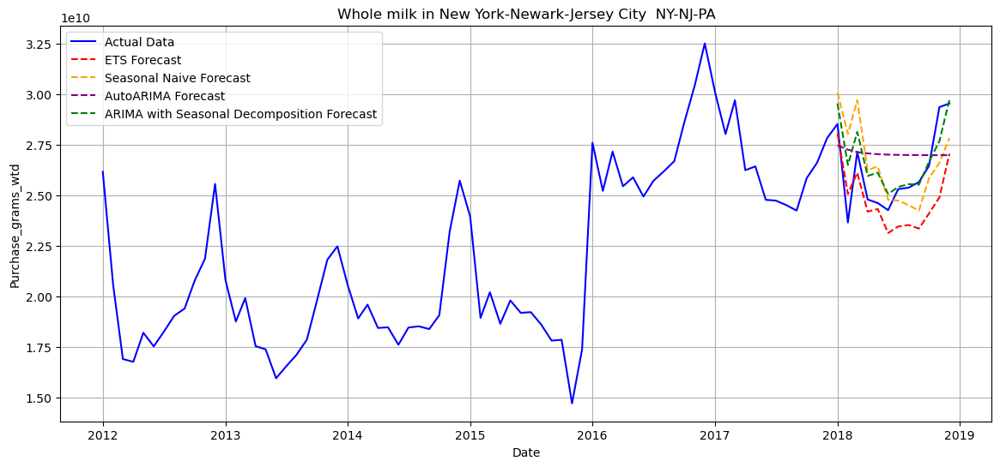

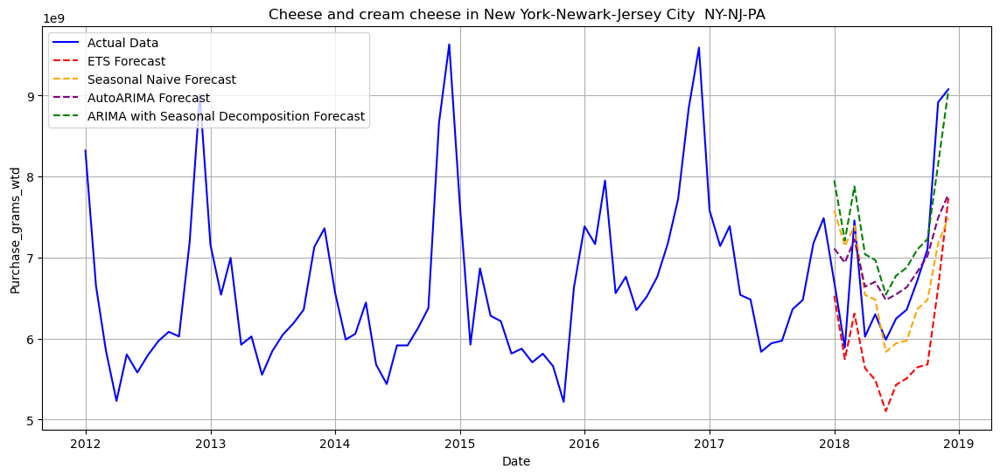

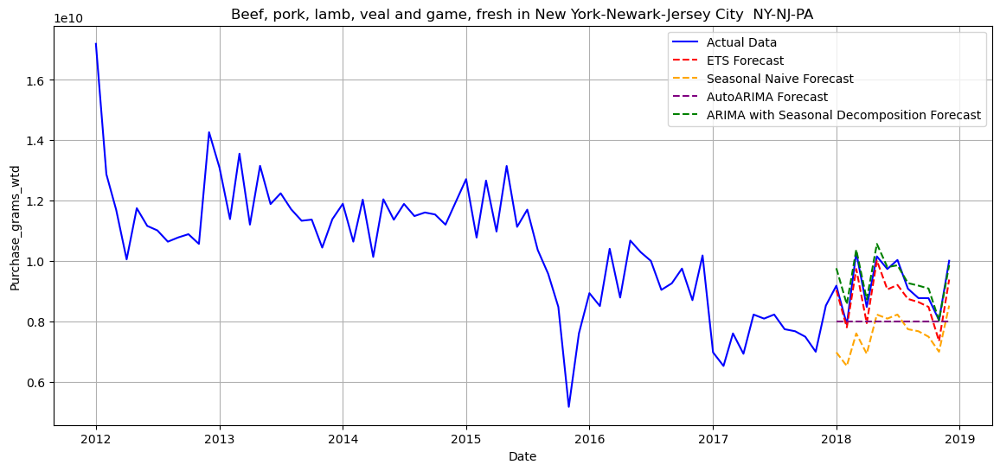

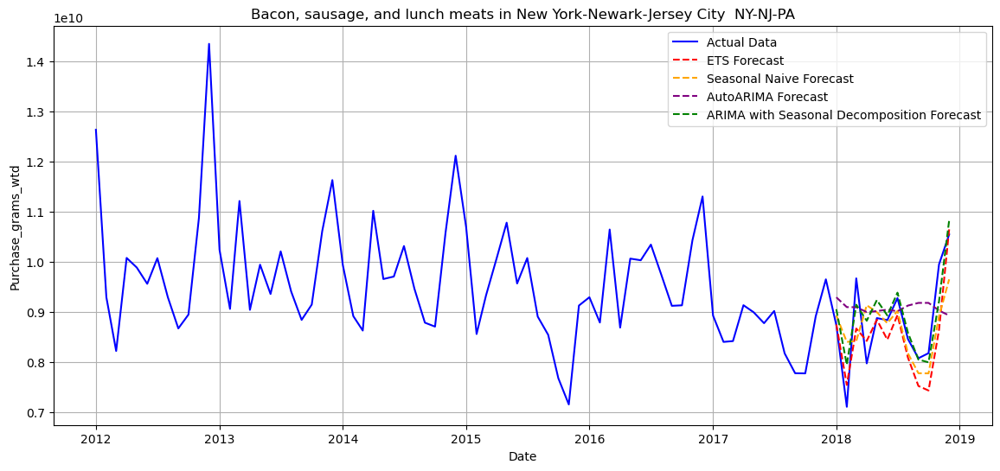

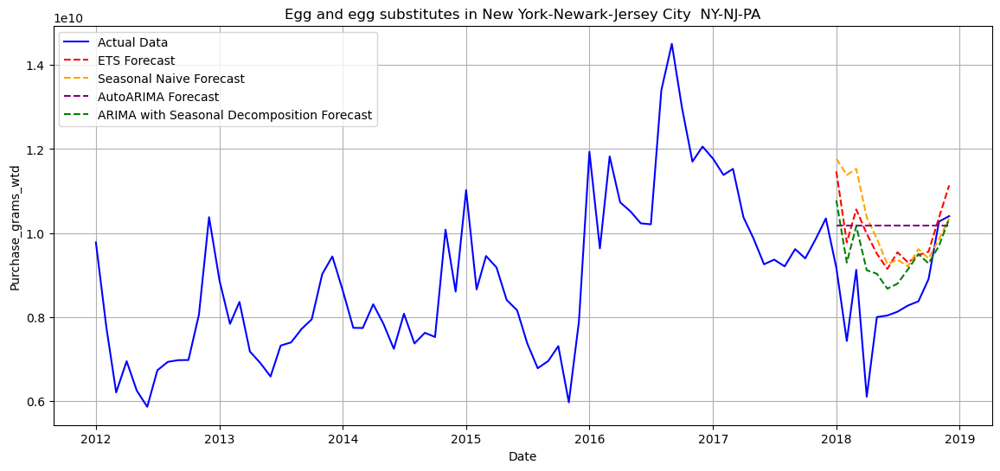

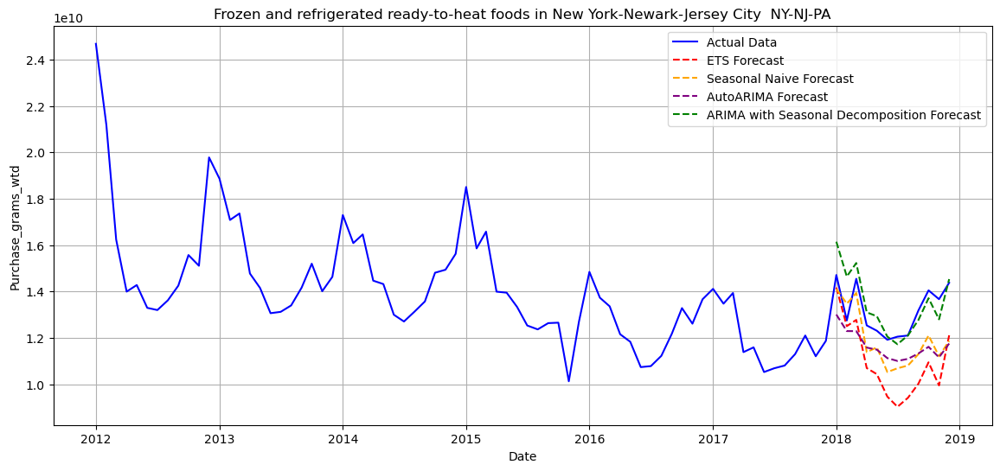

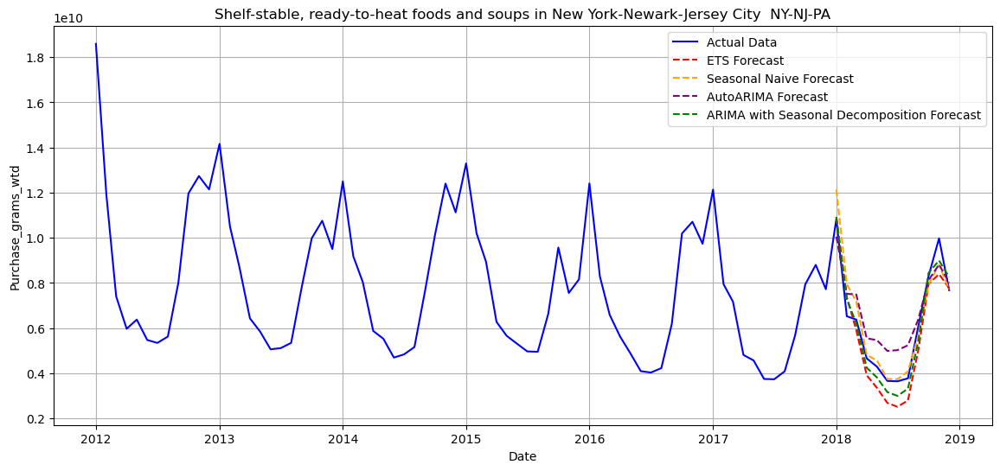

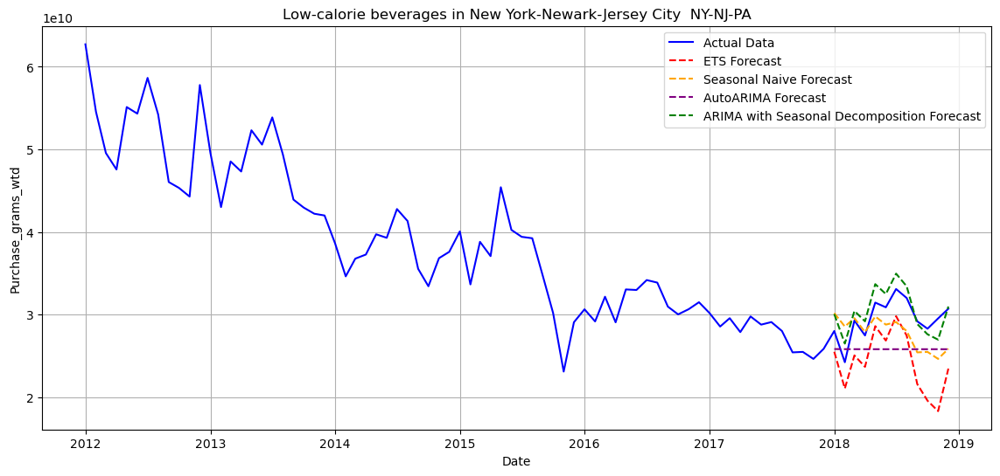

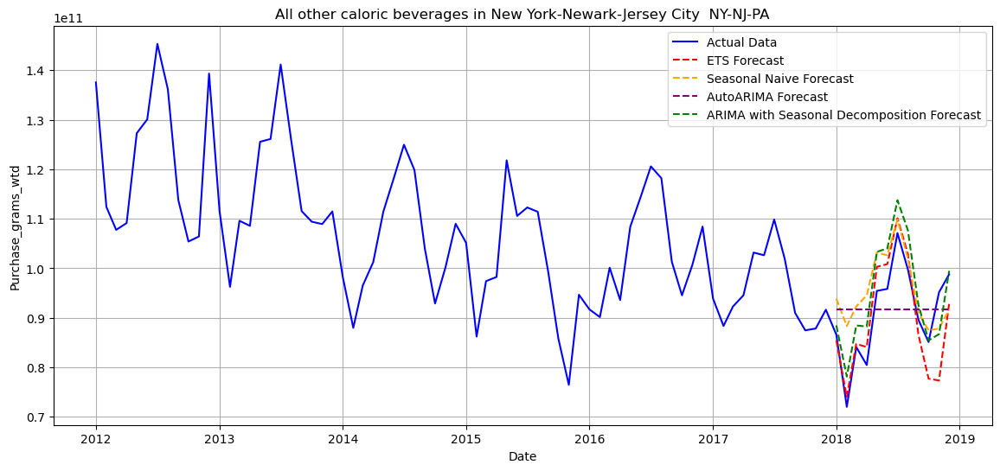

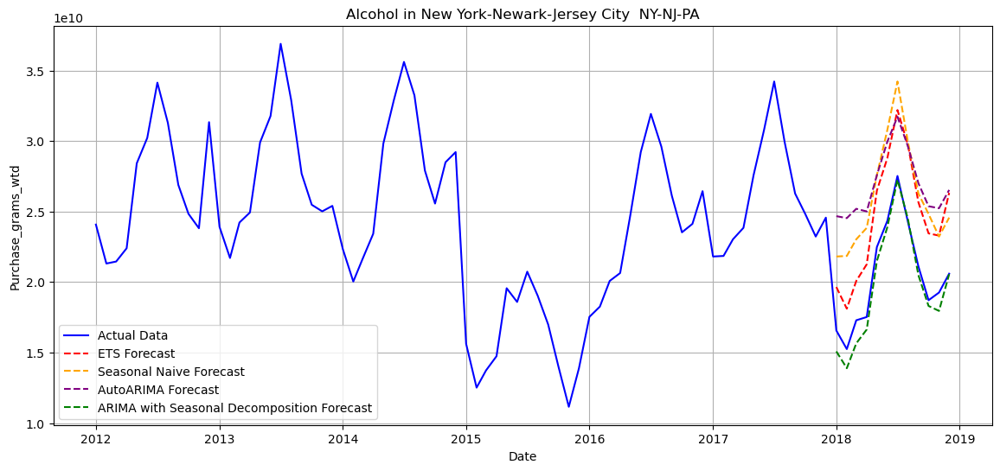

In [23]:
target_metroregion = 'New York-Newark-Jersey City  NY-NJ-PA'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in 'New York-Newark-Jersey City  NY-NJ-PA' 

In [24]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,New York-Newark-Jersey City NY-NJ-PA,1.687825e+09,2.017657e+09,1.681982e+09,1.561867e+09,1.853445e+09,2.091598e+09,"{'Order': (1, 1, 1), 'Seasonal_Order': (0, 0, ...",9.007312e+08,1.202300e+09,ARIMA
1,Cheese and cream cheese,New York-Newark-Jersey City NY-NJ-PA,9.448408e+08,1.102521e+09,6.709693e+08,8.658945e+08,5.586259e+08,7.081129e+08,"{'Order': (1, 0, 1), 'Seasonal_Order': (2, 0, ...",6.318028e+08,7.411980e+08,AutoARIMA
2,"Beef, pork, lamb, veal and game, fresh",New York-Newark-Jersey City NY-NJ-PA,4.198742e+08,4.880914e+08,1.619115e+09,1.681726e+09,1.223680e+09,1.448259e+09,"{'Order': (0, 1, 1), 'Seasonal_Order': (0, 0, ...",2.752410e+08,3.394765e+08,ARIMA
3,"Bacon, sausage, and lunch meats",New York-Newark-Jersey City NY-NJ-PA,4.790568e+08,6.051377e+08,6.054427e+08,7.604279e+08,8.404016e+08,9.978477e+08,"{'Order': (0, 1, 2), 'Seasonal_Order': (1, 0, ...",3.712317e+08,4.686417e+08,ARIMA
4,Egg and egg substitutes,New York-Newark-Jersey City NY-NJ-PA,1.467897e+09,1.748663e+09,1.725582e+09,1.256409e+09,1.720473e+09,2.017179e+09,"{'Order': (0, 1, 1), 'Seasonal_Order': (0, 0, ...",1.072574e+09,1.311781e+09,Seasonal Naive
5,Frozen and refrigerated ready-to-heat foods,New York-Newark-Jersey City NY-NJ-PA,2.223764e+09,2.438706e+09,1.387906e+09,1.534630e+09,1.538686e+09,1.710061e+09,"{'Order': (0, 1, 4), 'Seasonal_Order': (1, 0, ...",6.206014e+08,8.176760e+08,ARIMA
6,"Shelf-stable, ready-to-heat foods and soups",New York-Newark-Jersey City NY-NJ-PA,7.710667e+08,8.813629e+08,5.363213e+08,7.214135e+08,9.247243e+08,1.016690e+09,"{'Order': (2, 0, 4), 'Seasonal_Order': (1, 0, ...",4.861558e+08,5.492198e+08,ARIMA
7,Low-calorie beverages,New York-Newark-Jersey City NY-NJ-PA,5.268307e+09,5.893269e+09,2.938573e+09,1.343433e+09,3.965120e+09,4.345205e+09,"{'Order': (1, 1, 1), 'Seasonal_Order': (0, 0, ...",1.510891e+09,1.678848e+09,Seasonal Naive
8,All other caloric beverages,New York-Newark-Jersey City NY-NJ-PA,4.789441e+09,6.468307e+09,6.970652e+09,5.982209e+08,7.848208e+09,9.305021e+09,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",5.266526e+09,6.034697e+09,Seasonal Naive
9,Alcohol,New York-Newark-Jersey City NY-NJ-PA,4.178090e+09,4.276121e+09,5.589896e+09,1.685522e+09,6.463172e+09,6.613826e+09,"{'Order': (3, 0, 4), 'Seasonal_Order': (2, 0, ...",8.025914e+08,9.593382e+08,ARIMA


## 'Philadelphia-Camden-Wilmington  PA-NJ-DE-MD'


Processing Metroregion: Philadelphia-Camden-Wilmington  PA-NJ-DE-MD



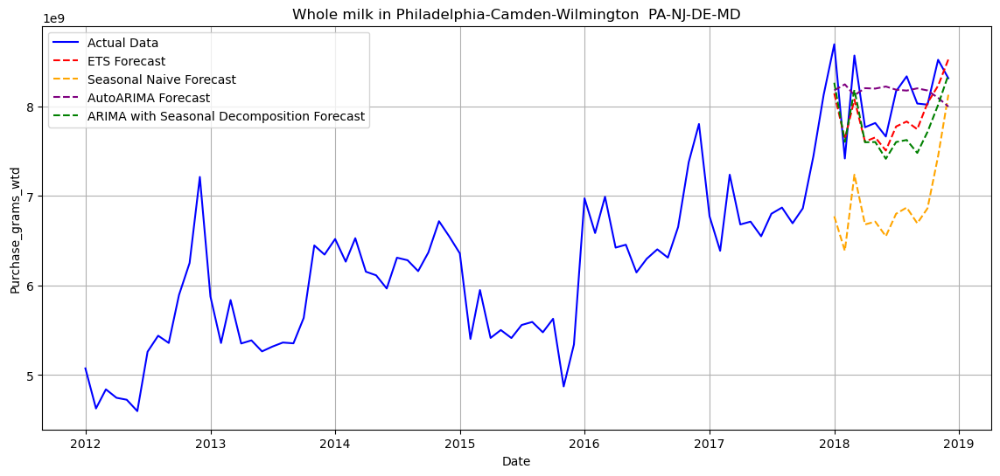

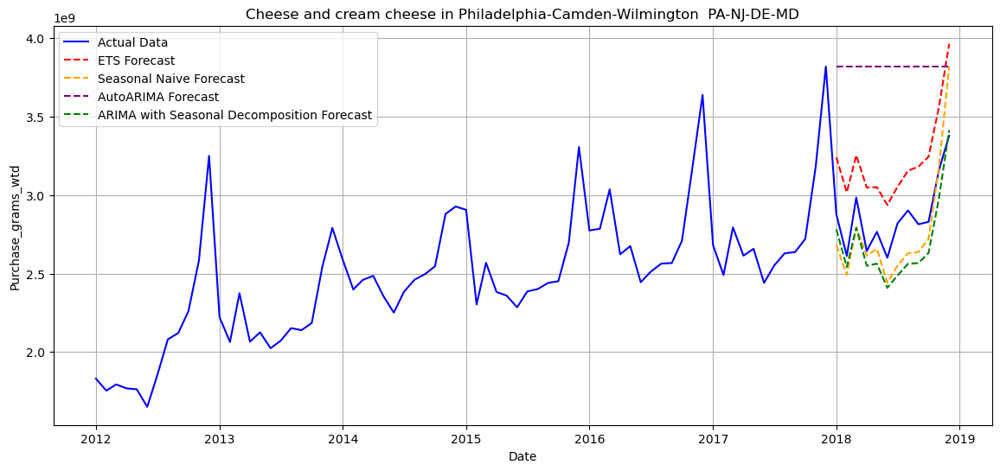

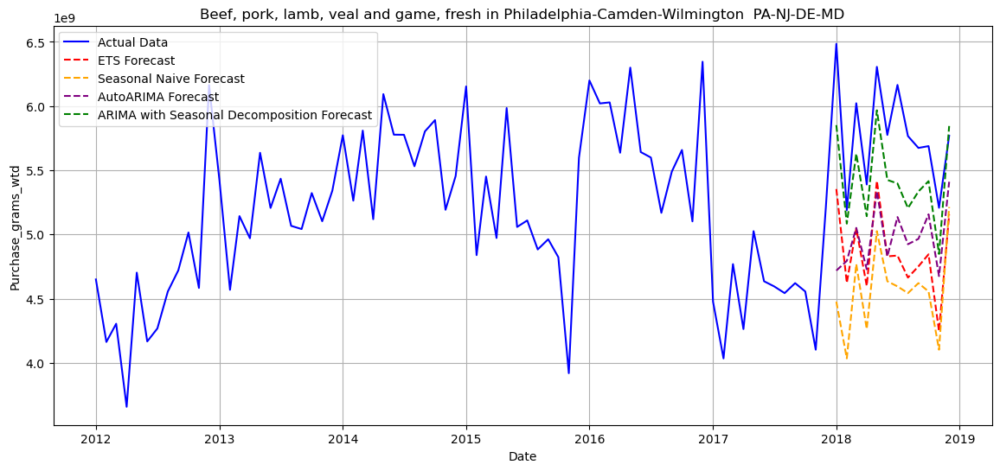

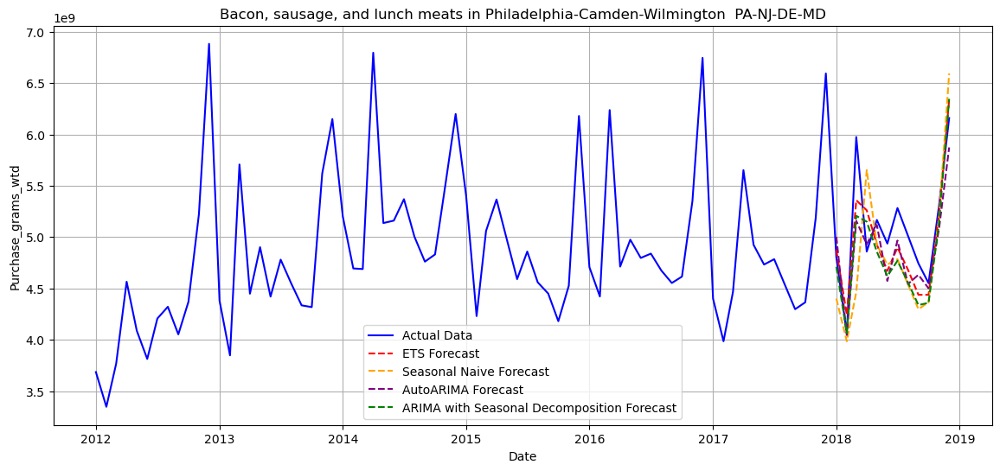

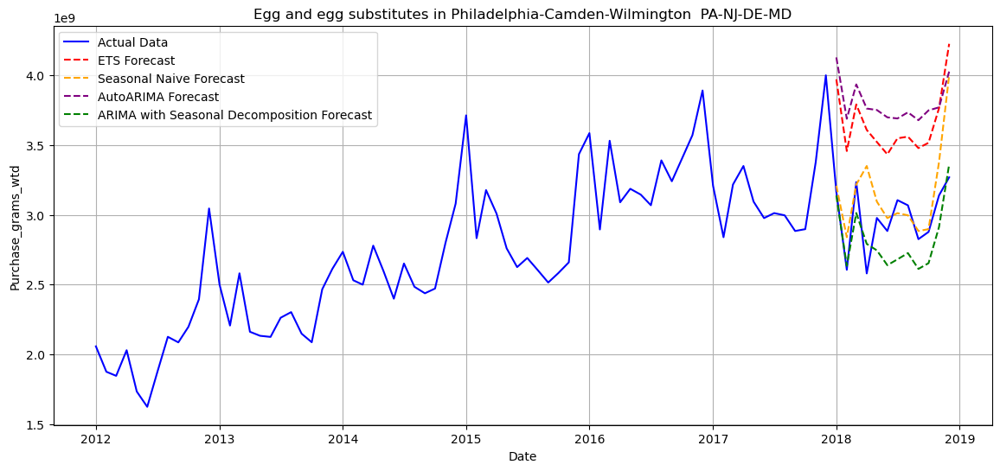

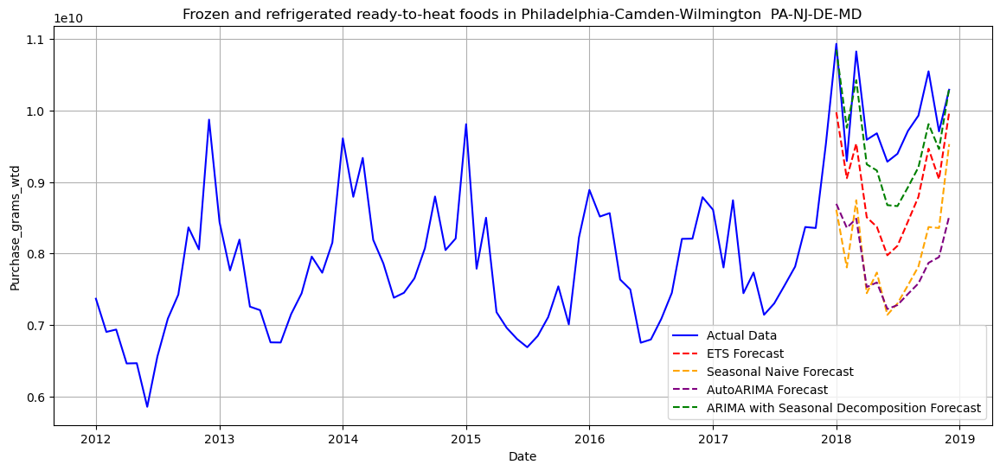

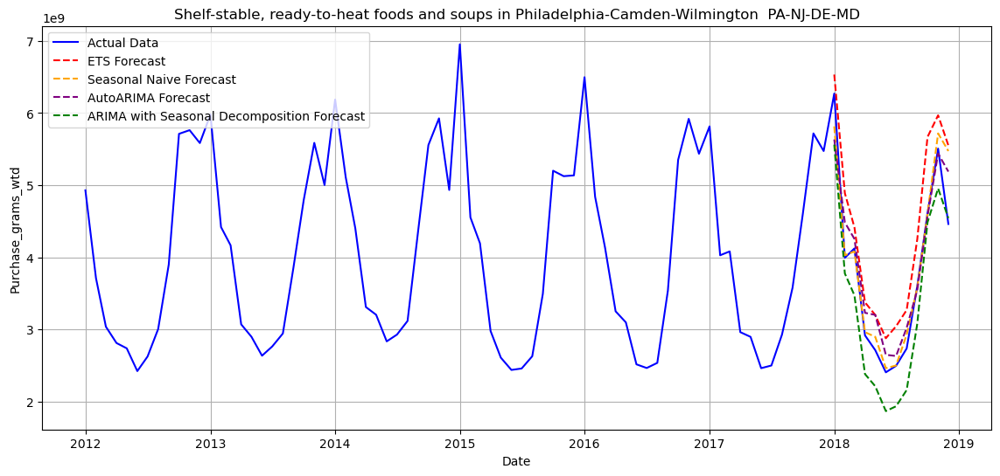

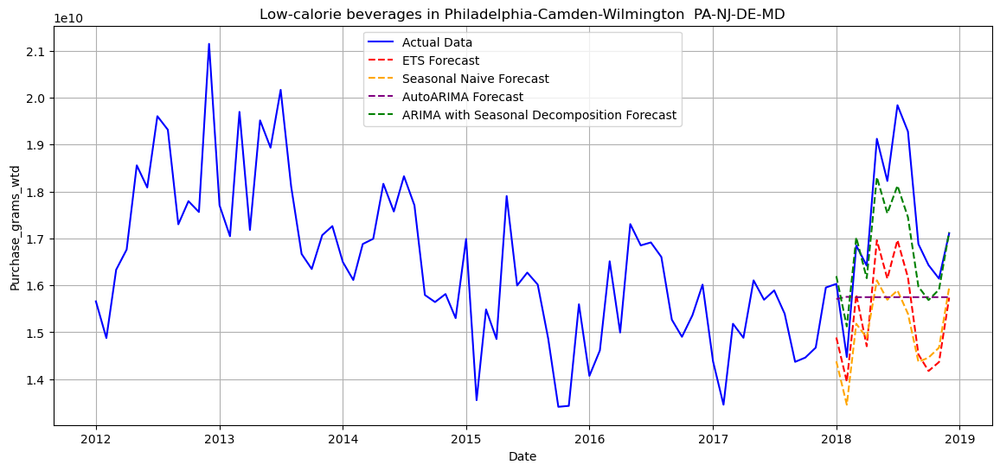

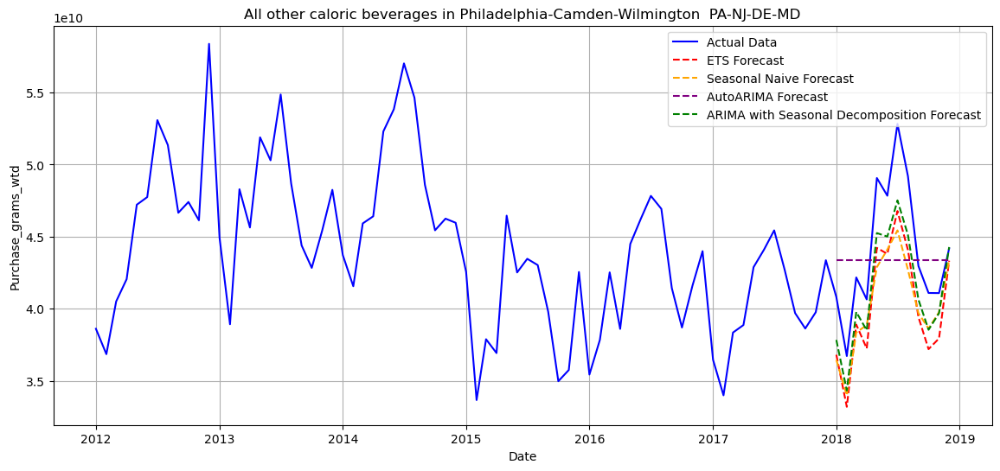

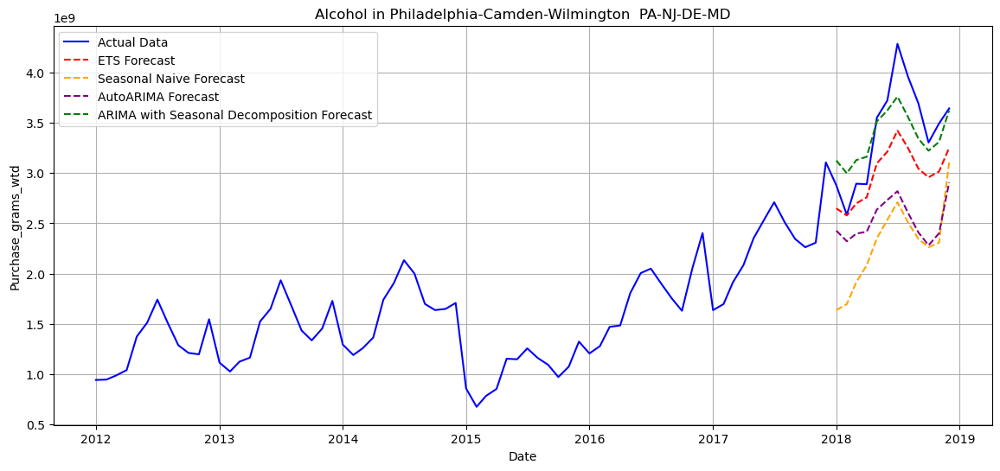

In [25]:
target_metroregion = 'Philadelphia-Camden-Wilmington  PA-NJ-DE-MD'
results_df = analyze_metroregion(data, target_metroregion)
results_df = results_df.drop(columns=['ARIMA_Seasonal_Decomposition_Forecast'])

#### Table showing RMSE, MAE for different food categories in 'Philadelphia-Camden-Wilmington  PA-NJ-DE-MD' 

In [26]:
best_results_df= best_model(results_df)
best_results_df

,EFPG_name,Metroregion_name,MAE_ETS,RMSE_ETS,MAE_Seasonal_Naive,RMSE_Seasonal_Naive,MAE_AutoARIMA,RMSE_AutoARIMA,Order_AutoARIMA,MAE_ARIMA_Seasonal_Decomposition,RMSE_ARIMA_Seasonal_Decomposition,Best_Model
0,Whole milk,Philadelphia-Camden-Wilmington PA-NJ-DE-MD,2.865807e+08,3.273430e+08,1.181594e+09,1.242055e+09,3.675662e+08,4.239967e+08,"{'Order': (1, 1, 0), 'Seasonal_Order': (1, 0, ...",3.587433e+08,4.063928e+08,ETS
1,Cheese and cream cheese,Philadelphia-Camden-Wilmington PA-NJ-DE-MD,3.601139e+08,3.716879e+08,1.745592e+08,2.066173e+08,9.540354e+08,9.784733e+08,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",1.817189e+08,2.036940e+08,ARIMA
2,"Beef, pork, lamb, veal and game, fresh",Philadelphia-Camden-Wilmington PA-NJ-DE-MD,9.226115e+08,9.446516e+08,1.216946e+09,1.259299e+09,8.091493e+08,8.875716e+08,"{'Order': (4, 0, 2), 'Seasonal_Order': (1, 0, ...",3.703367e+08,4.177258e+08,ARIMA
3,"Bacon, sausage, and lunch meats",Philadelphia-Camden-Wilmington PA-NJ-DE-MD,2.644408e+08,3.041447e+08,4.486713e+08,5.834202e+08,2.482055e+08,3.314712e+08,"{'Order': (2, 0, 2), 'Seasonal_Order': (1, 0, ...",3.083728e+08,3.669142e+08,ETS
4,Egg and egg substitutes,Philadelphia-Camden-Wilmington PA-NJ-DE-MD,6.780115e+08,7.015385e+08,2.070461e+08,3.263399e+08,8.224412e+08,8.403513e+08,"{'Order': (0, 1, 1), 'Seasonal_Order': (1, 0, ...",2.071623e+08,2.346065e+08,ARIMA
5,Frozen and refrigerated ready-to-heat foods,Philadelphia-Camden-Wilmington PA-NJ-DE-MD,9.952347e+08,1.060649e+09,1.897819e+09,1.948195e+09,2.055086e+09,2.096586e+09,"{'Order': (4, 0, 0), 'Seasonal_Order': (0, 0, ...",4.719882e+08,5.341877e+08,ARIMA
6,"Shelf-stable, ready-to-heat foods and soups",Philadelphia-Camden-Wilmington PA-NJ-DE-MD,6.007425e+08,6.551579e+08,1.888968e+08,3.359147e+08,3.018678e+08,3.760505e+08,"{'Order': (5, 0, 4), 'Seasonal_Order': (2, 0, ...",4.639713e+08,5.035813e+08,Seasonal Naive
7,Low-calorie beverages,Philadelphia-Camden-Wilmington PA-NJ-DE-MD,1.868024e+09,2.004904e+09,2.196015e+09,1.628769e+09,1.701308e+09,2.118768e+09,"{'Order': (1, 1, 0), 'Seasonal_Order': (0, 0, ...",6.844908e+08,8.854755e+08,ARIMA
8,All other caloric beverages,Philadelphia-Camden-Wilmington PA-NJ-DE-MD,3.807435e+09,3.996282e+09,3.697365e+09,8.864135e+08,3.696300e+09,4.534596e+09,"{'Order': (0, 1, 0), 'Seasonal_Order': (0, 0, ...",2.693227e+09,2.975357e+09,Seasonal Naive
9,Alcohol,Philadelphia-Camden-Wilmington PA-NJ-DE-MD,4.138505e+08,4.785381e+08,1.120745e+09,1.154352e+09,8.791055e+08,9.567221e+08,"{'Order': (1, 0, 0), 'Seasonal_Order': (0, 1, ...",2.388796e+08,2.849199e+08,ARIMA
